<a href="https://colab.research.google.com/github/MaritzaB/computo_conexionista/blob/feature%2Fcifar_training/Copy_of_Clasificador_tumores_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Instalar dependencias

In [1]:
# clonar el repositorio de YOLOv5
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 16308, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (172/172), done.
remote: Total 16308 (delta 96), reused 94 (delta 33), pack-reused 16103
Receiving objects: 100% (16308/16308), 15.04 MiB | 16.16 MiB/s, done.
Resolving deltas: 100% (11132/11132), done.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [2]:
# instalar dependencias de ser necesario
!pip install -qr requirements.txt  # (ignore errors)
import sys
sys.path.append('/content/yolov5/')

import torch

from IPython.display import Image, clear_output
from utils.downloads import attempt_download

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 78.8 MB/s eta 0:00:00
Setup complete. Using torch 2.1.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


# Download Custom Dataset





![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [8]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

RuntimeError: API Key is of Incorrect Type 
 Expected Type: <class 'str'>
 Input Type: <class 'NoneType'>

In [9]:
#obtener el dataset almacenado en la plataforma Roboflow
%cd /content/yolov5

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="lPwwRvo9T5aANdWSYniP")
project = rf.workspace("cicpatternclassification").project("tumor-h22ta")
dataset = project.version(5).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Tumor-5 in yolov5pytorch:: 100%|██████████| 2178/2178 [00:00<00:00, 8072.15it/s]


In [10]:
# our dataset
%cat {dataset.location}/data.yaml

names:
- Tumor
nc: 1
roboflow:
  license: CC BY 4.0
  project: tumor-h22ta
  url: https://universe.roboflow.com/cicpatternclassification/tumor-h22ta/dataset/5
  version: 5
  workspace: cicpatternclassification
test: ../test/images
train: Tumor-5/train/images
val: Tumor-5/valid/images


# Definir configuración y arquitectura del modelo


In [12]:
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [13]:
# modelo que se utilizará para reentrenar
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [14]:
#
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [15]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parametros
nc: {num_classes}  # número de clases
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Entrenar detector YOLOv5 personalizado



Argumentos:
- **img:** tamaño de la imagen de entrada
- **batch:** tamaño del batch
- **epochs:** número de épocas
- **data:** establecer la ruta a nuestro archivo YAML
- **cfg:** especificar la configuración de nuestro modelo
- **weights:** ruta personalizada a los pesos
- **name:** nombre para los resultados obtenidos
- **nosave:** guardar sólo el checkpoint final
- **cache:** imágenes en caché para un entrenamiento más rápido

In [16]:
# entrenar YOLOv5 en nuestros datos
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 90 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2024-01-15 01:11:48.689283: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-15 01:11:48.689341: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-15 01:11:48.691296: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-15 01:11:50.241556: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/Tumor-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=90, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoan

# Evaluar el rendimiento del detector YOLOv5 reentrenado

In [17]:

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

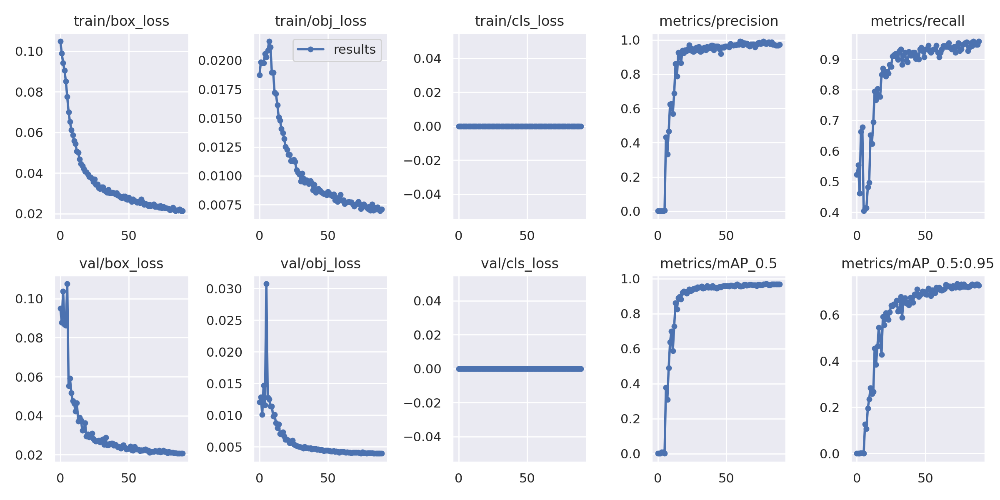

In [18]:

from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

### Visualización de algunas imágenes de entrenamiento


GROUND TRUTH TRAINING DATA:


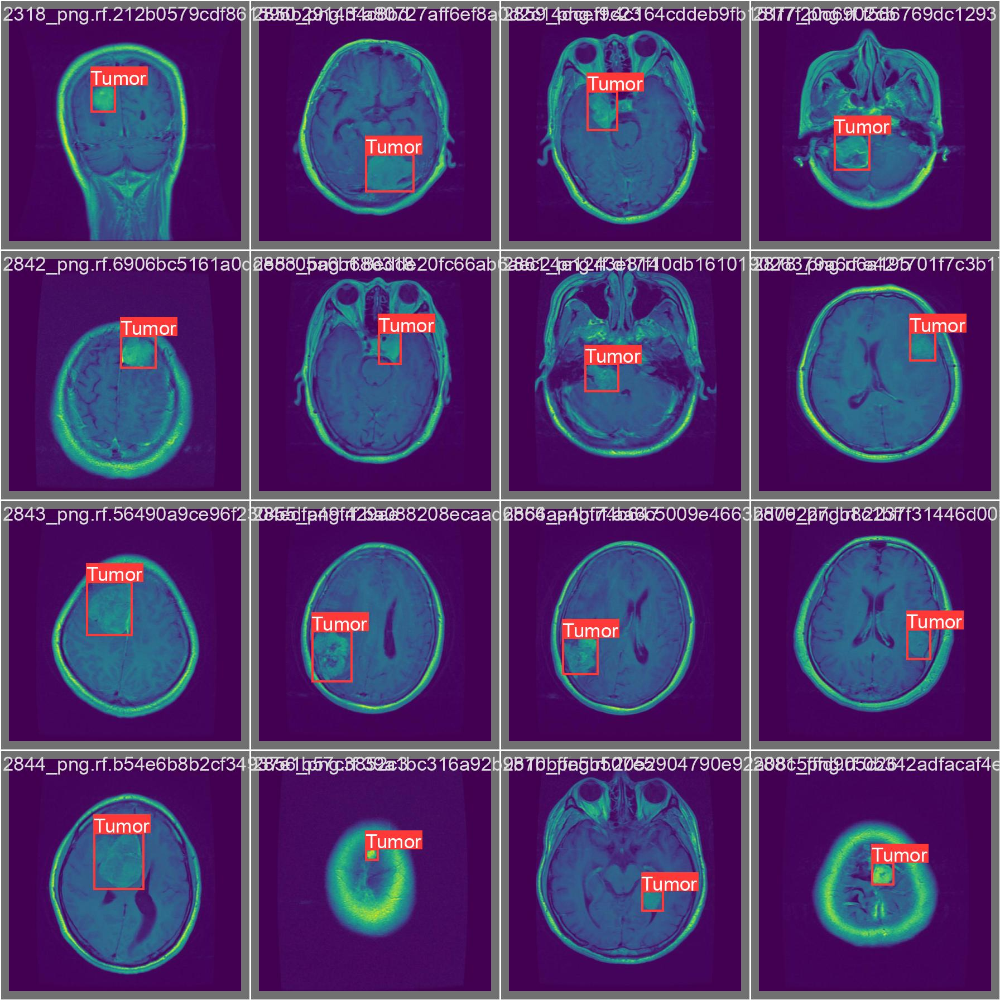

In [20]:

print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


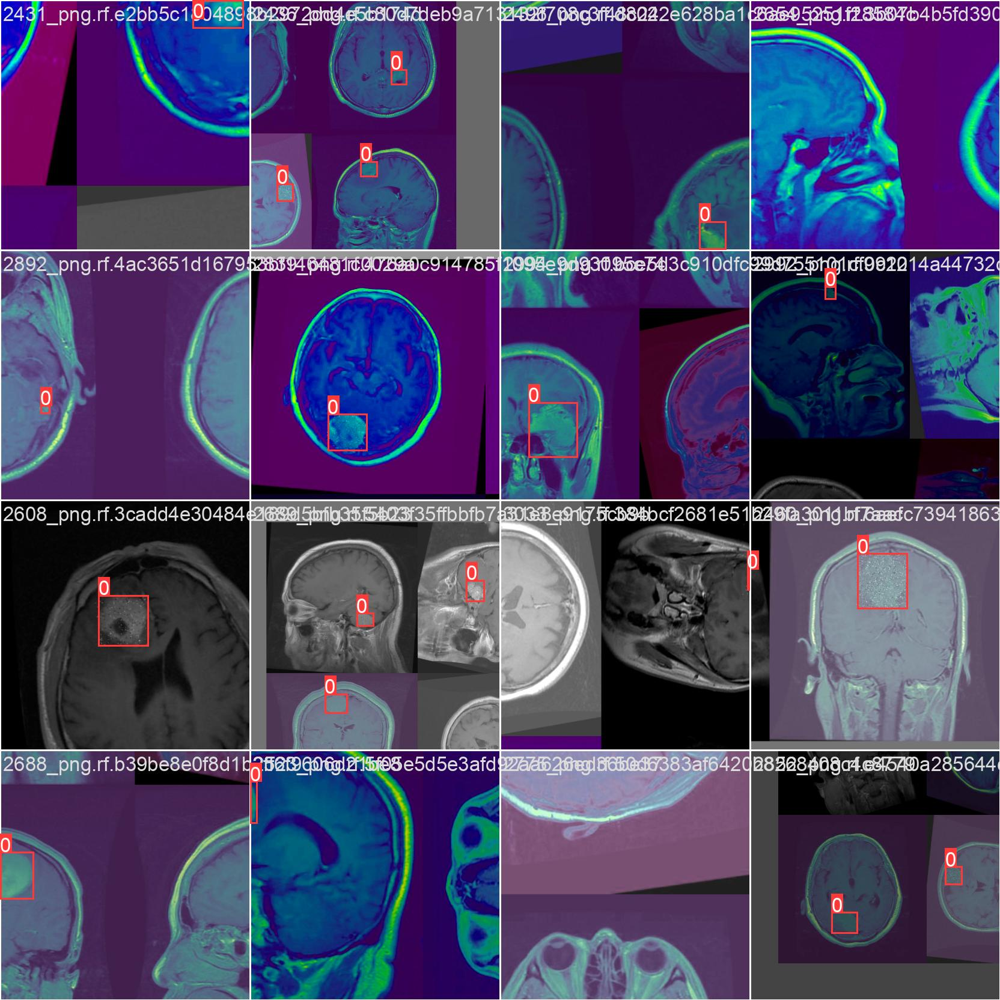

In [21]:
# imágenes de entrenamiento creadas con data augmentation
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch2.jpg', width=900)

#Ejecutar infernecia a partir de los pesos del entrenamiento

In [22]:

# los pesos son guardados
%ls runs/

train/


In [23]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [24]:
#usamos los mejores pesos
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../yolov5/Tumor-5/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../yolov5/Tumor-5/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7246518 parameters, 0 gradients
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/108 /content/yolov5/Tumor-5/test/images/2302_png.rf.e89b91def373175ba5e81758884e7a32.jpg: 416x416 1 Tumor, 9.3ms
image 2/108 /content/yolov5/Tumor-5/test/images/2303_png.rf.3ddeab9a60be2bfdc0e3b8b575a32e2e.jpg: 416x416 1 Tumor, 12.1ms
image 3/108 /content/yolov5/T

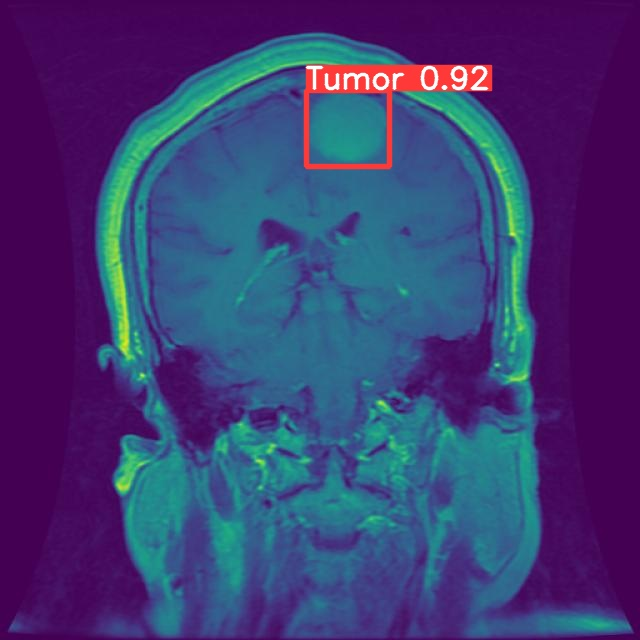

/content/yolov5/runs/detect/exp/3047_png.rf.9a30efed131c3877cf7727b32e89eb5c.jpg




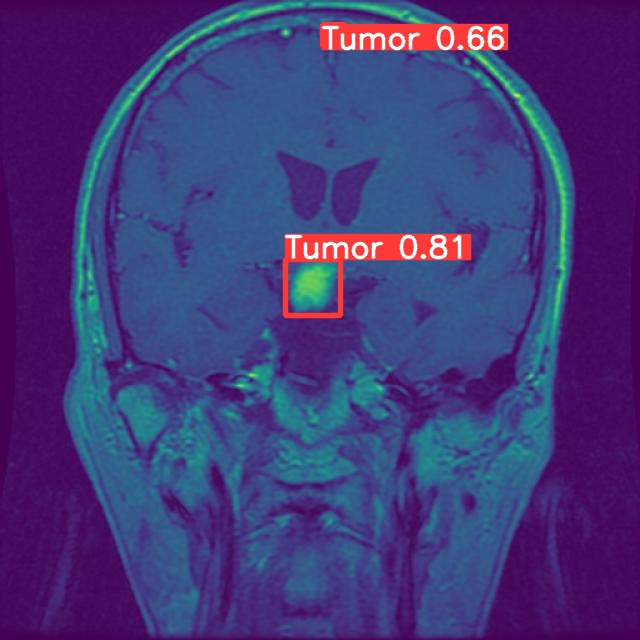

/content/yolov5/runs/detect/exp/3012_png.rf.49eb1ebf55023dd867ecd24f7d3ac5c9.jpg




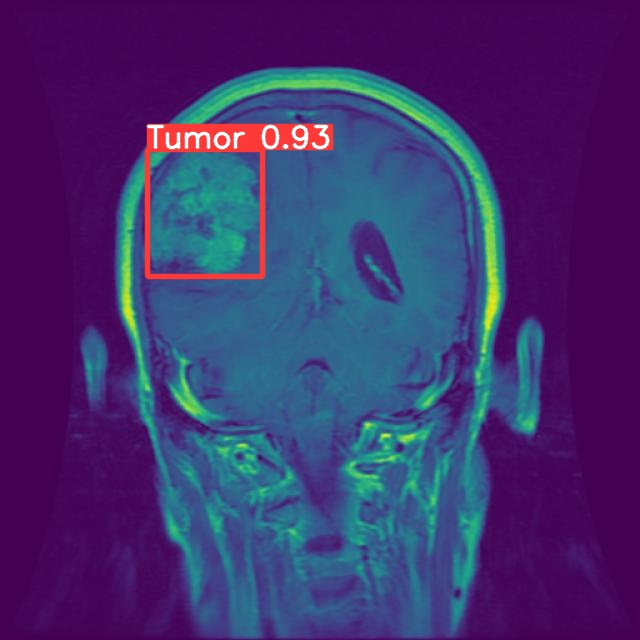

/content/yolov5/runs/detect/exp/2342_png.rf.b8502caf7fde99514c8a321225b66ae8.jpg




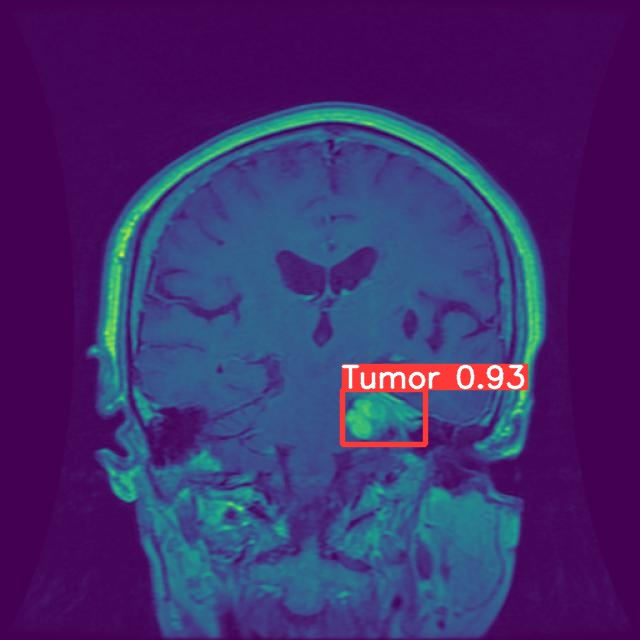

/content/yolov5/runs/detect/exp/2971_png.rf.59551e248ea6c8706571ff1a3ce38244.jpg




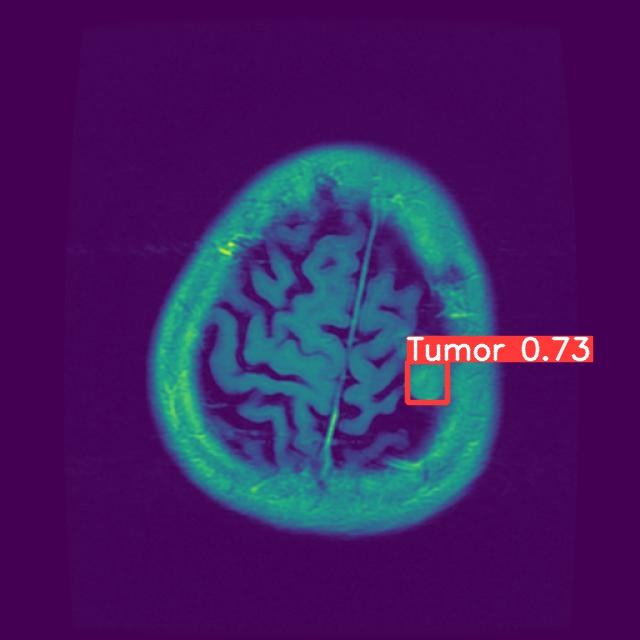

/content/yolov5/runs/detect/exp/2808_png.rf.dafb5416fecd98b0b8b10ad8ca98c5bd.jpg




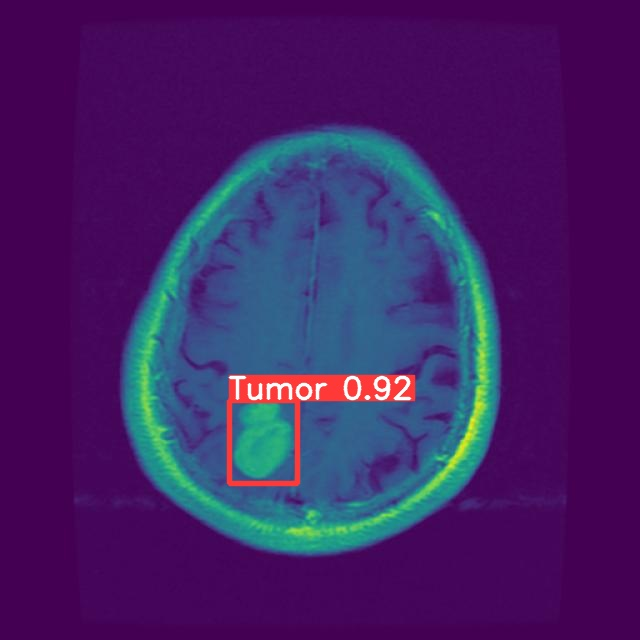

/content/yolov5/runs/detect/exp/2887_png.rf.dd5d3a2d616ed3b9527cc0d7eb0e5d81.jpg




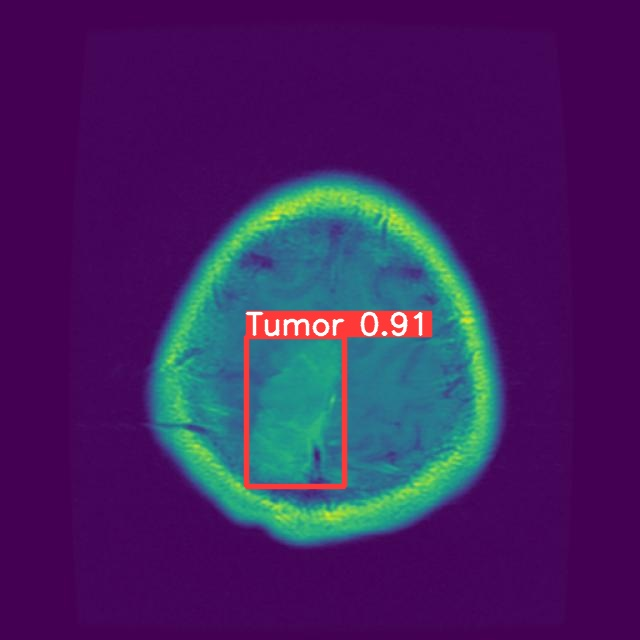

/content/yolov5/runs/detect/exp/2920_png.rf.851bc9326d3e336a4dd74348e8f73d50.jpg




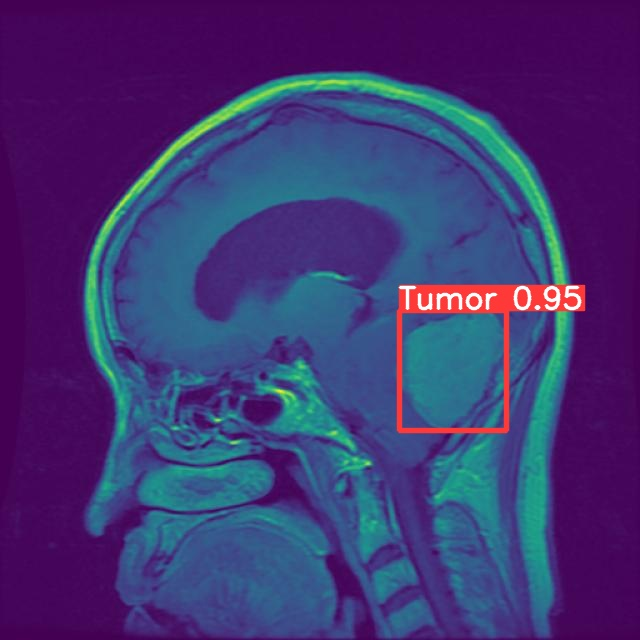

/content/yolov5/runs/detect/exp/2549_png.rf.534921bb4c4b66d909f5fcc9d8b022b6.jpg




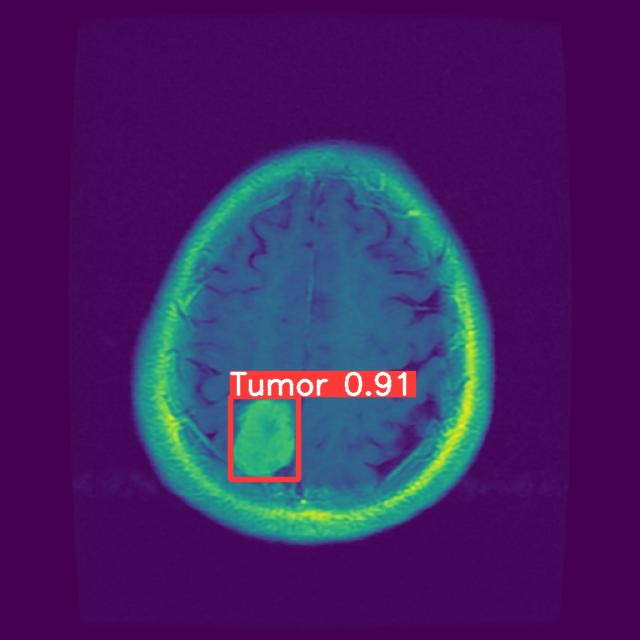

/content/yolov5/runs/detect/exp/2909_png.rf.c2fced0ded46c7bb18add1fd337688c5.jpg




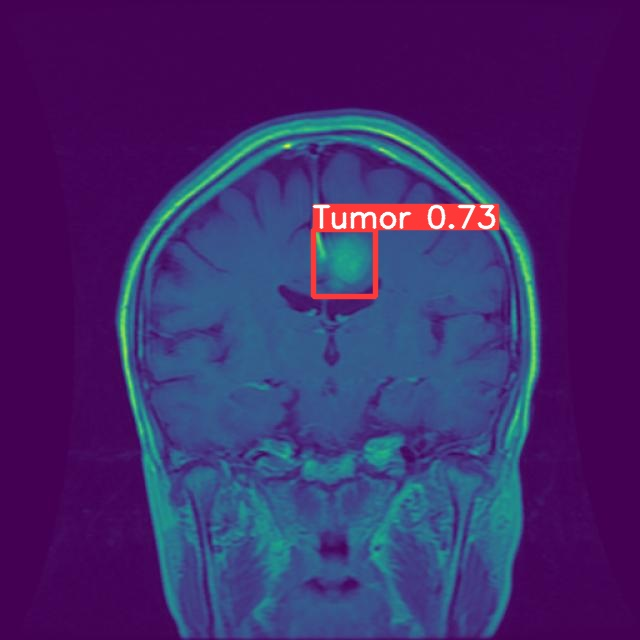

/content/yolov5/runs/detect/exp/2388_png.rf.22abd15a3d8ff97015988f850f549442.jpg




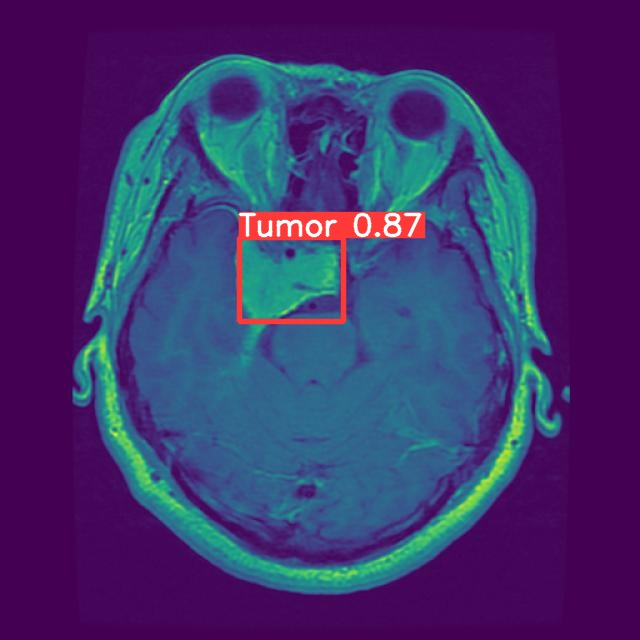

/content/yolov5/runs/detect/exp/2899_png.rf.3f4d430502ee534a7423c995073530a1.jpg




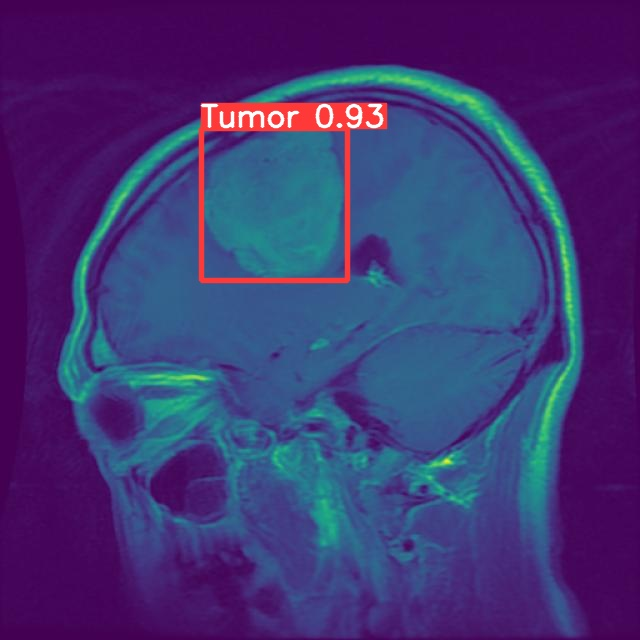

/content/yolov5/runs/detect/exp/2532_png.rf.9efed0a2bfdb2d32f29358a40755e46b.jpg




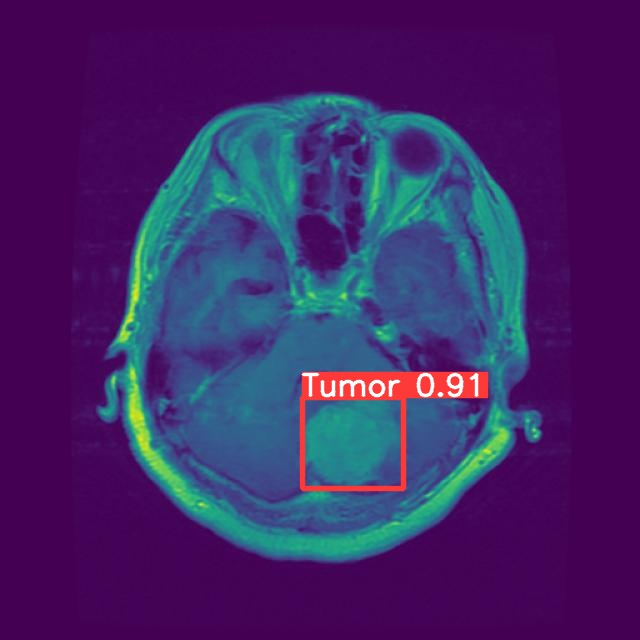

/content/yolov5/runs/detect/exp/2834_png.rf.2684f37bacb6c2063e1a79417c7bb137.jpg




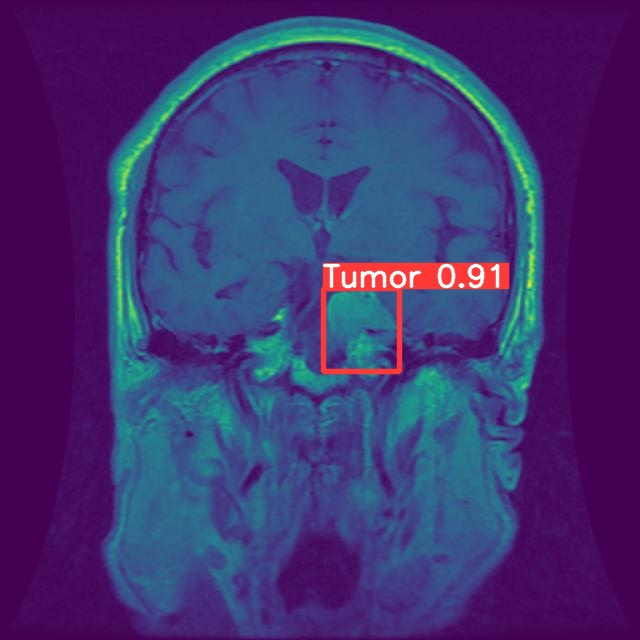

/content/yolov5/runs/detect/exp/2999_png.rf.19bbfb76eda933da96df1bd287f52159.jpg




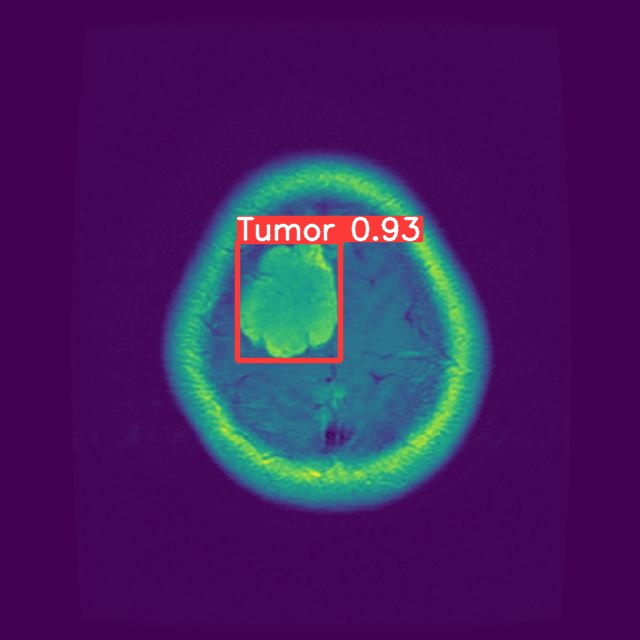

/content/yolov5/runs/detect/exp/2910_png.rf.c5cf2a37bbb6bd28c9222a9c26ba5fa2.jpg




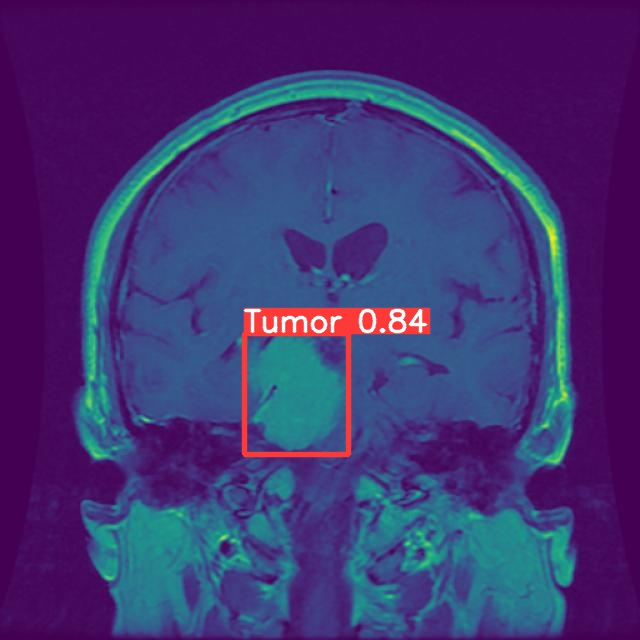

/content/yolov5/runs/detect/exp/2413_png.rf.e02e92ae39d70140be4d7e8b1fbf8f0b.jpg




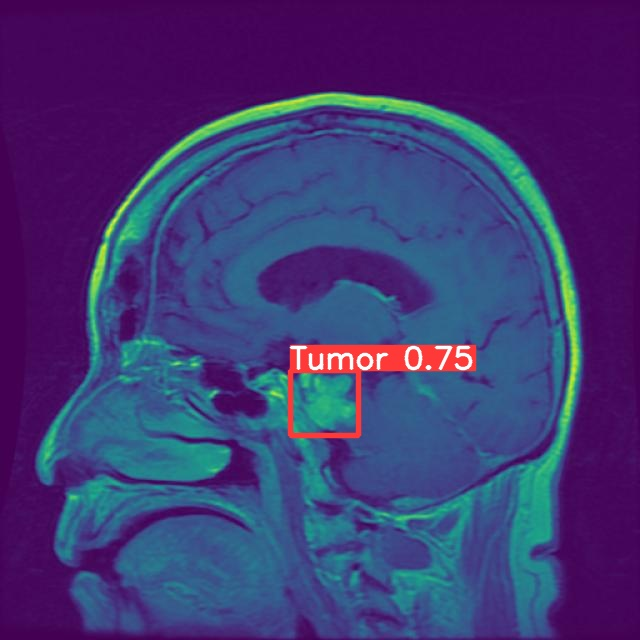

/content/yolov5/runs/detect/exp/2468_png.rf.4fcecff2f9aa799971b201e528a30336.jpg




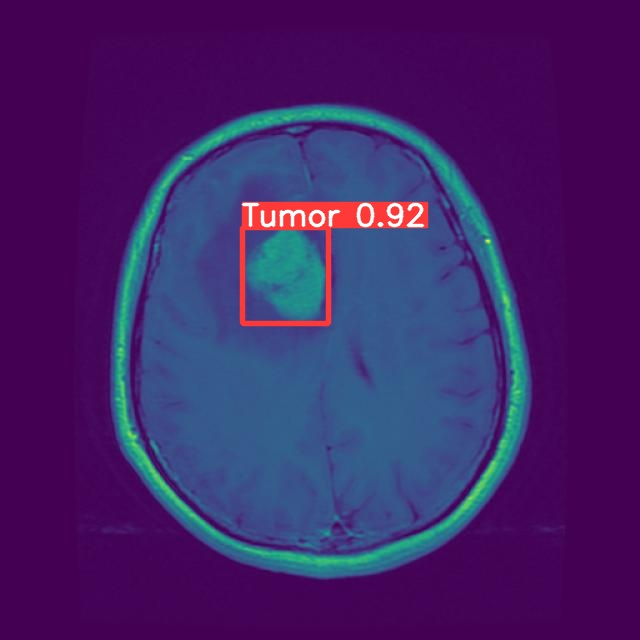

/content/yolov5/runs/detect/exp/2874_png.rf.035a60c5f57a2923ae6939e52a6b476a.jpg




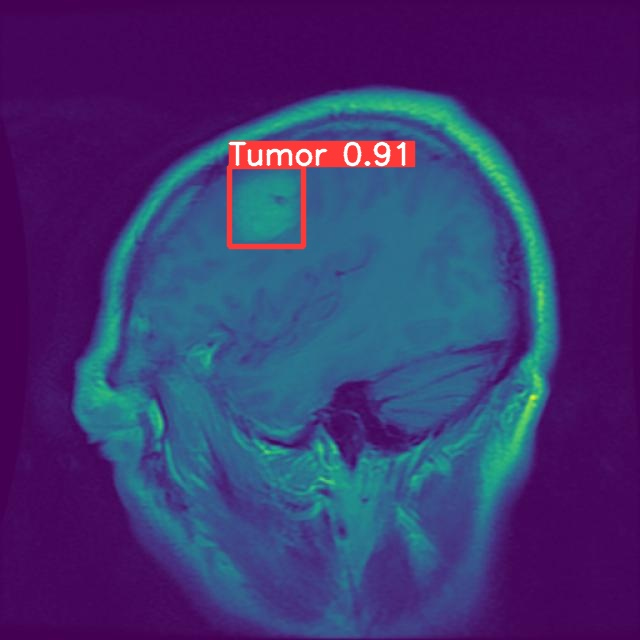

/content/yolov5/runs/detect/exp/2531_png.rf.c7bade29faaae3973577d018c7e6d8c1.jpg




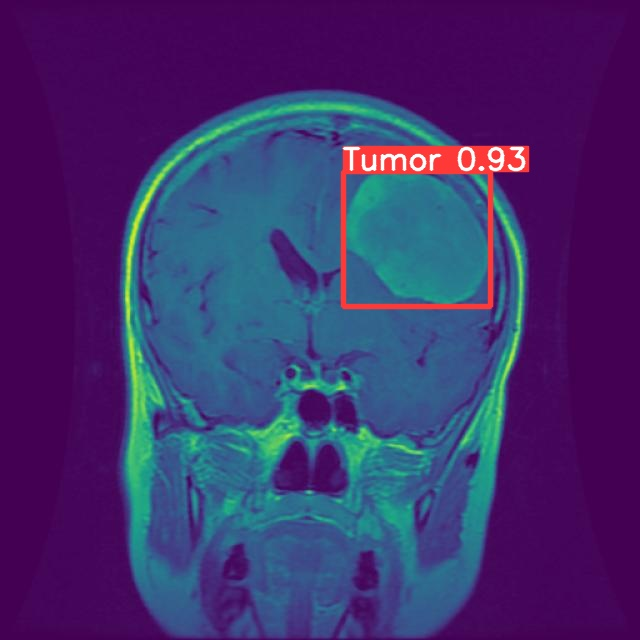

/content/yolov5/runs/detect/exp/2407_png.rf.76cd1d42cef7d9ca454e27cef097cbb9.jpg




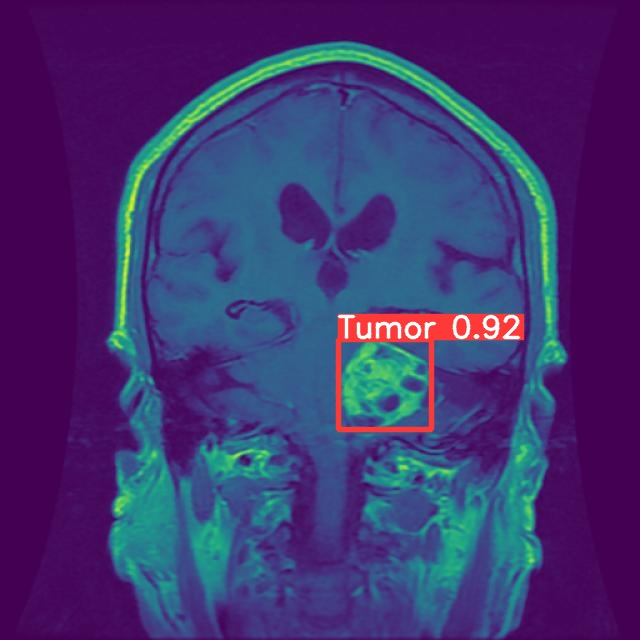

/content/yolov5/runs/detect/exp/3015_png.rf.37a44cb0727a8e24356549a6bed69c56.jpg




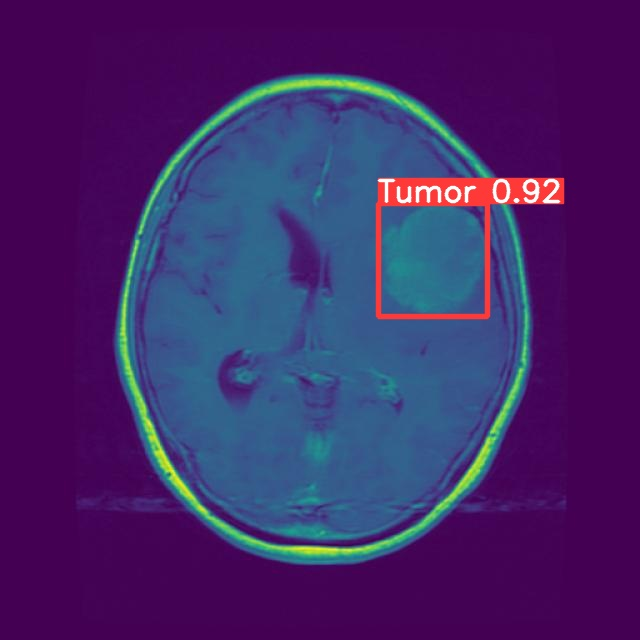

/content/yolov5/runs/detect/exp/2934_png.rf.5c08e2b8f4b2c8d9469519eabf0a309b.jpg




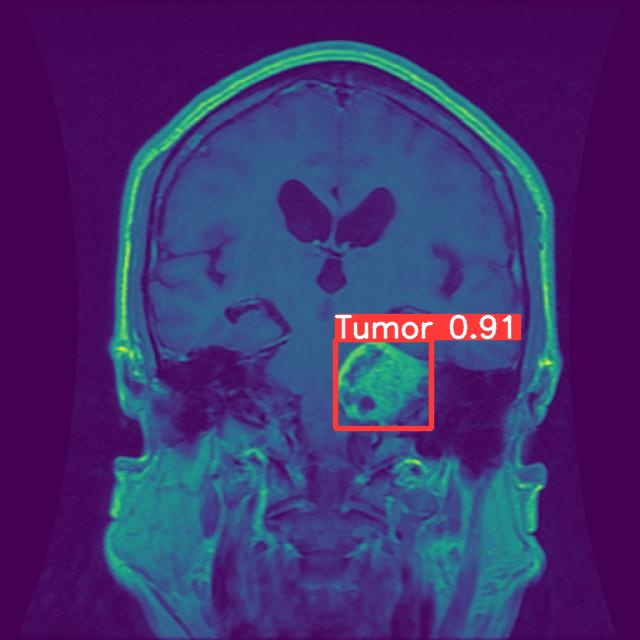

/content/yolov5/runs/detect/exp/3034_png.rf.9b3122e90c6538967f0b50d633f36ee9.jpg




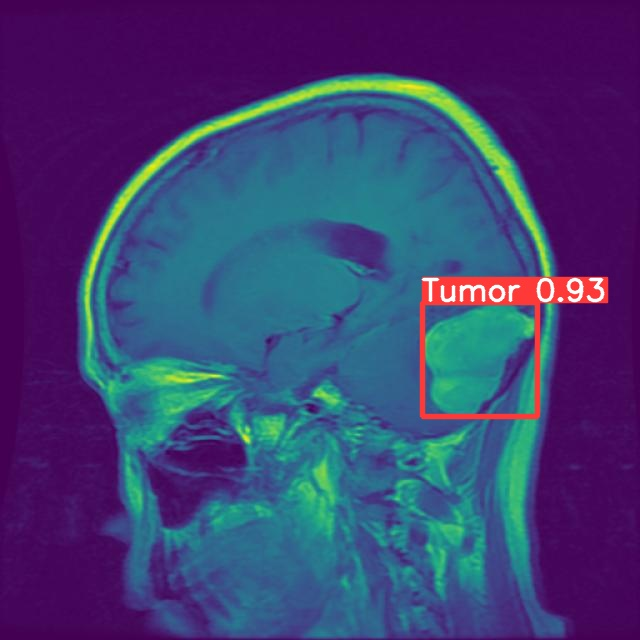

/content/yolov5/runs/detect/exp/2682_png.rf.5078634546ba2052001e0bf25a16431c.jpg




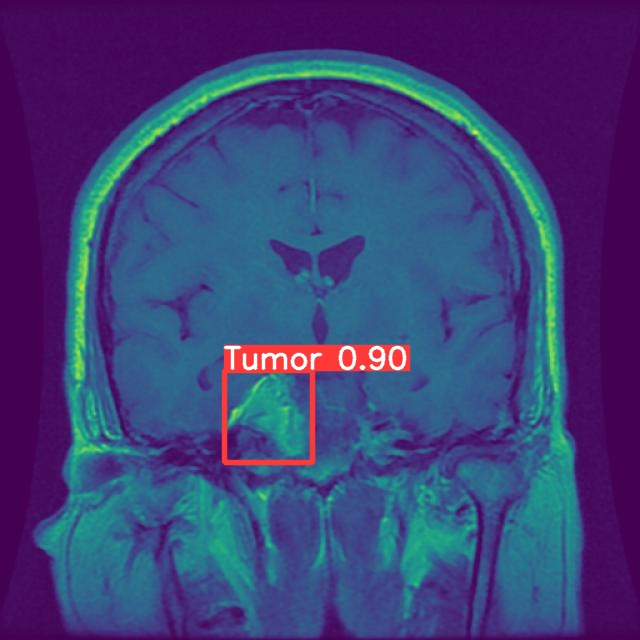

/content/yolov5/runs/detect/exp/2322_png.rf.7aa902b2a2c4aa0a5f3c59af55ea77e6.jpg




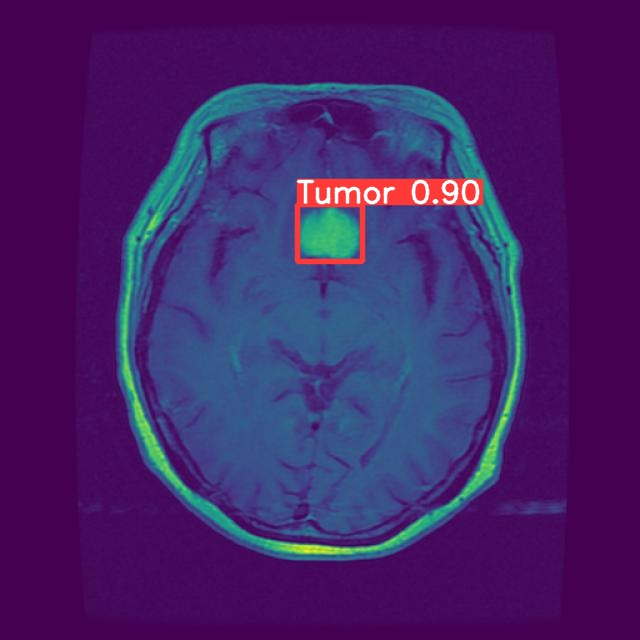

/content/yolov5/runs/detect/exp/2780_png.rf.318de5c46547cc805372e0caf9f74eb7.jpg




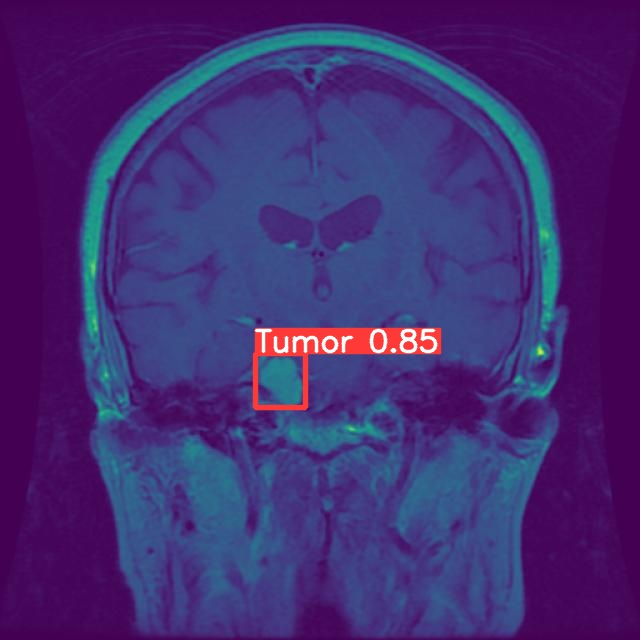

/content/yolov5/runs/detect/exp/3005_png.rf.1c38c9552e57cbb1ac55b9fb60eb8a7e.jpg




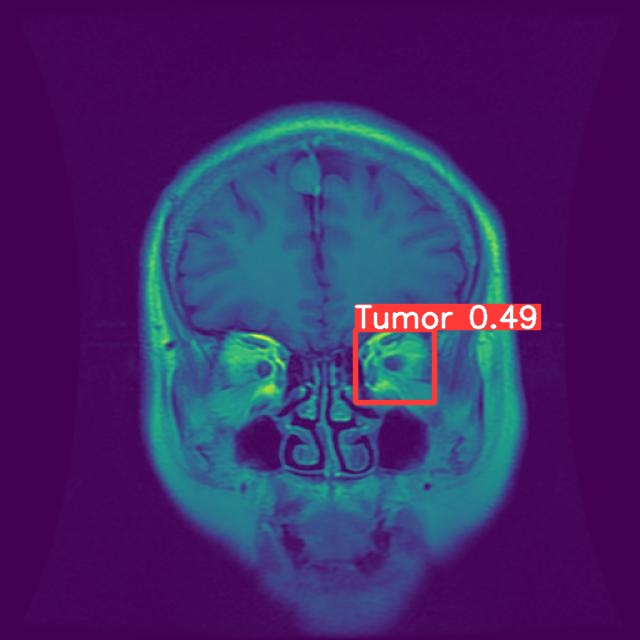

/content/yolov5/runs/detect/exp/3001_png.rf.a555929508ca4c64f9e3015909fa6ad6.jpg




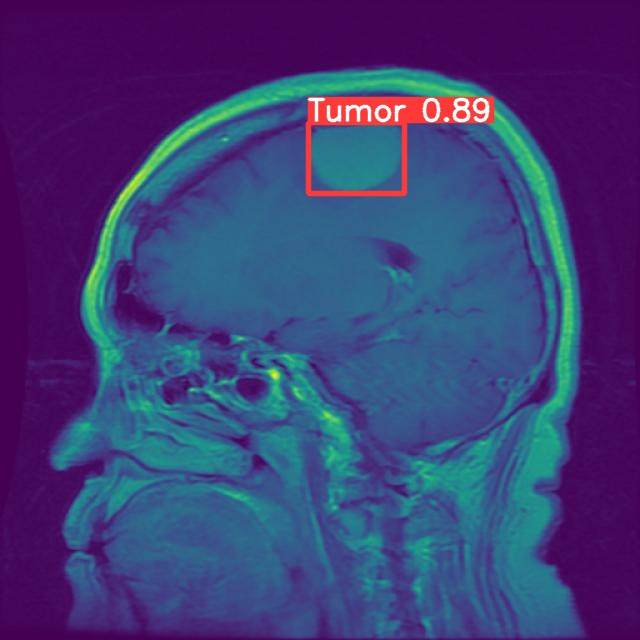

/content/yolov5/runs/detect/exp/2520_png.rf.e94f8003af3e7a2b05eab4714017a0ed.jpg




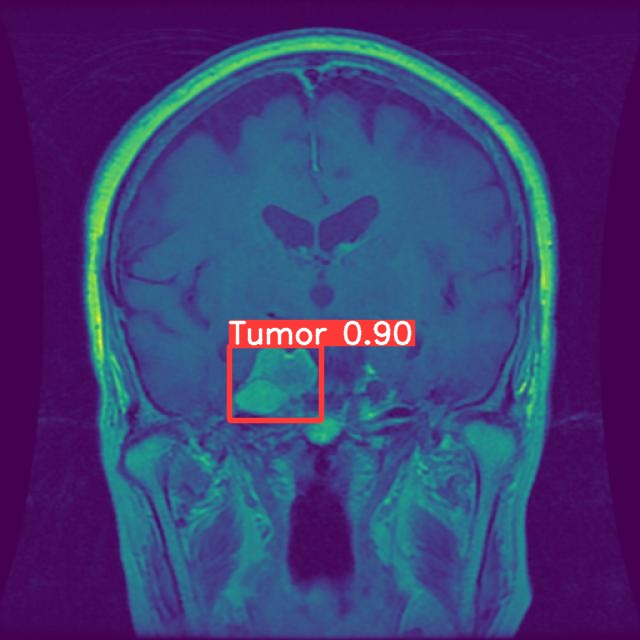

/content/yolov5/runs/detect/exp/3022_png.rf.044e9c3243925cd64c0dee211586e517.jpg




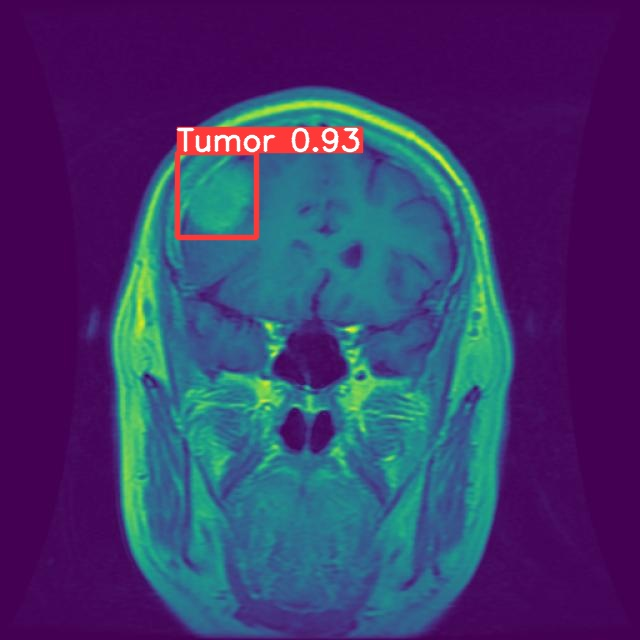

/content/yolov5/runs/detect/exp/3009_png.rf.da0a54ed579620de2ac1b53f7e4befe4.jpg




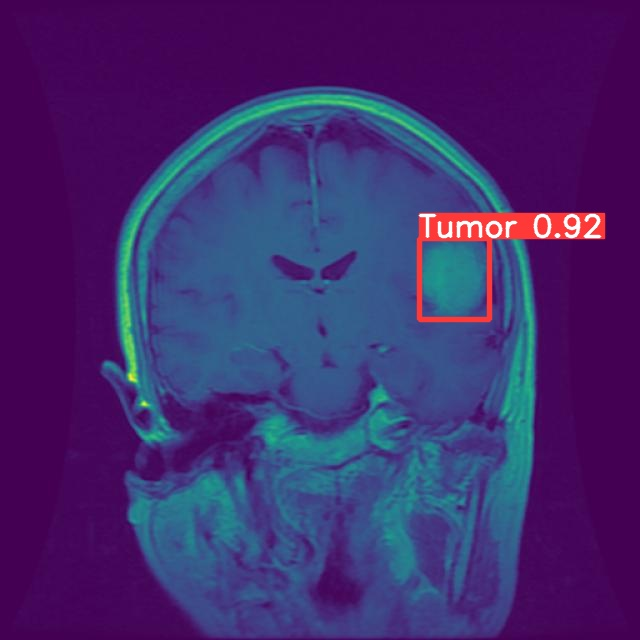

/content/yolov5/runs/detect/exp/3014_png.rf.5d4704ceadd85fb2926125b525506f33.jpg




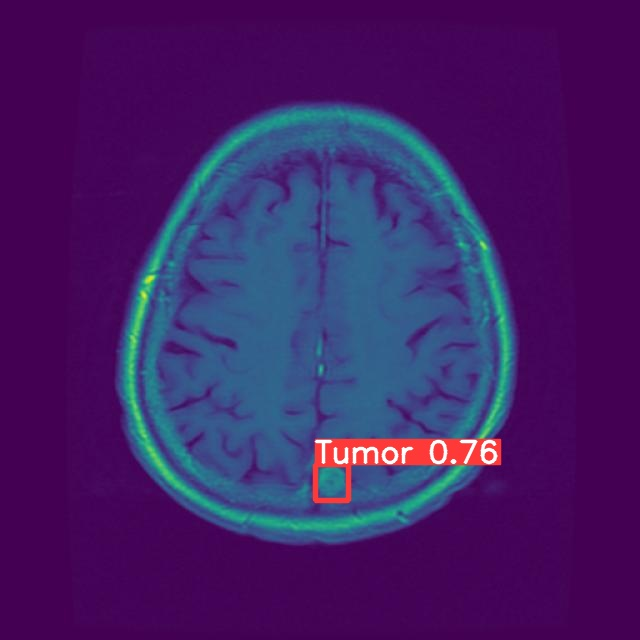

/content/yolov5/runs/detect/exp/2958_png.rf.fc9a4198d6416c4a7c6f7eece807a346.jpg




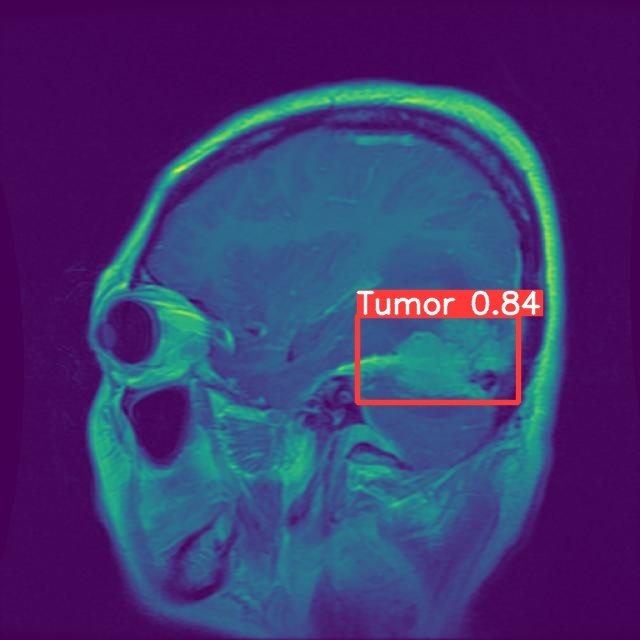

/content/yolov5/runs/detect/exp/2552_png.rf.9f75b69bc48289a50aa730c52ef659b8.jpg




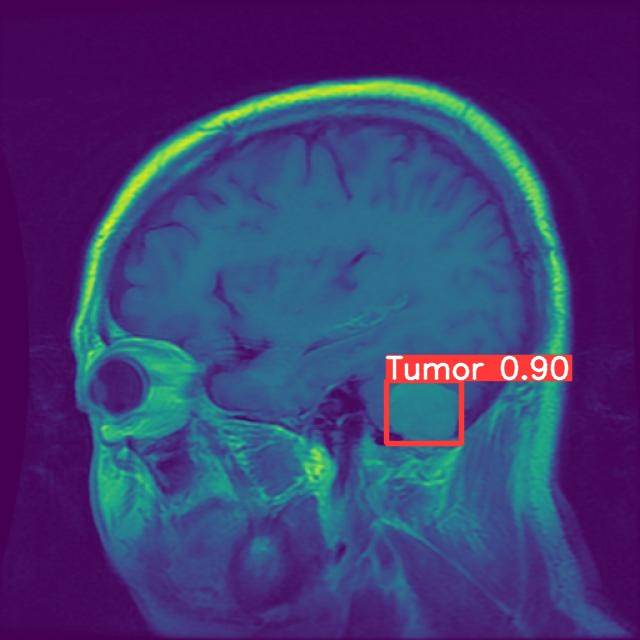

/content/yolov5/runs/detect/exp/2670_png.rf.f22fb813ba884c8f59b919d844e38fc4.jpg




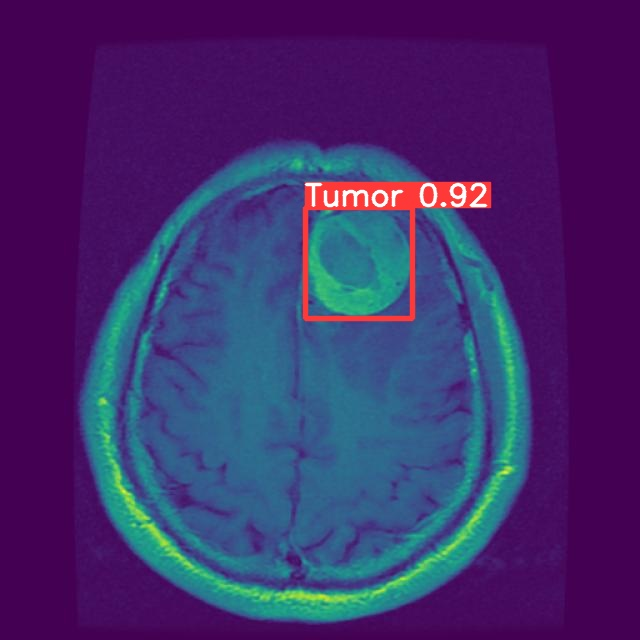

/content/yolov5/runs/detect/exp/2832_png.rf.cd3547f62447014a8bf932146a1493ce.jpg




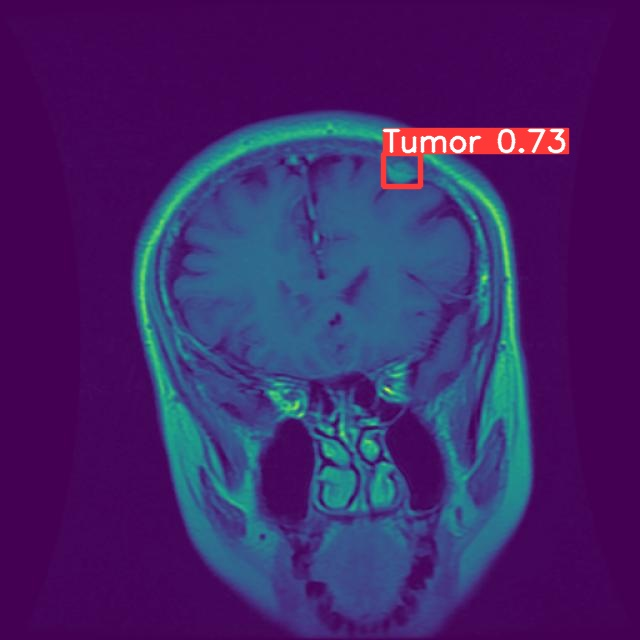

/content/yolov5/runs/detect/exp/2387_png.rf.7b1e7cd026a75f790ab6618fd961c4e5.jpg




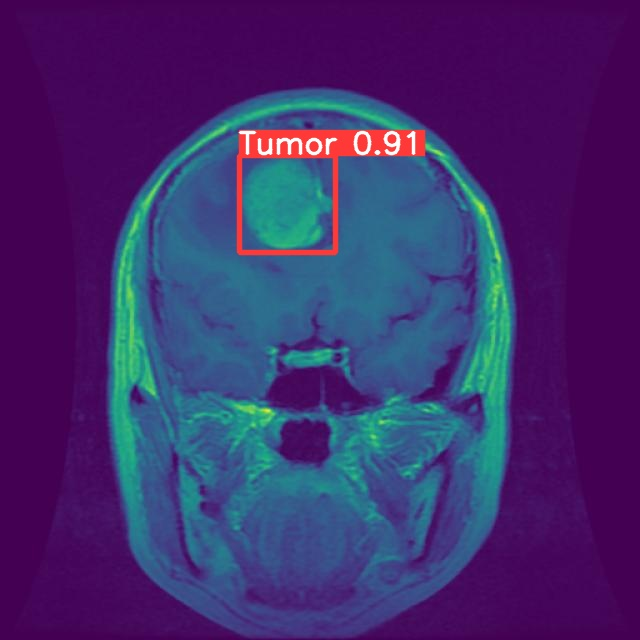

/content/yolov5/runs/detect/exp/2343_png.rf.5656db13040f79cb3c2f964de2973cd4.jpg




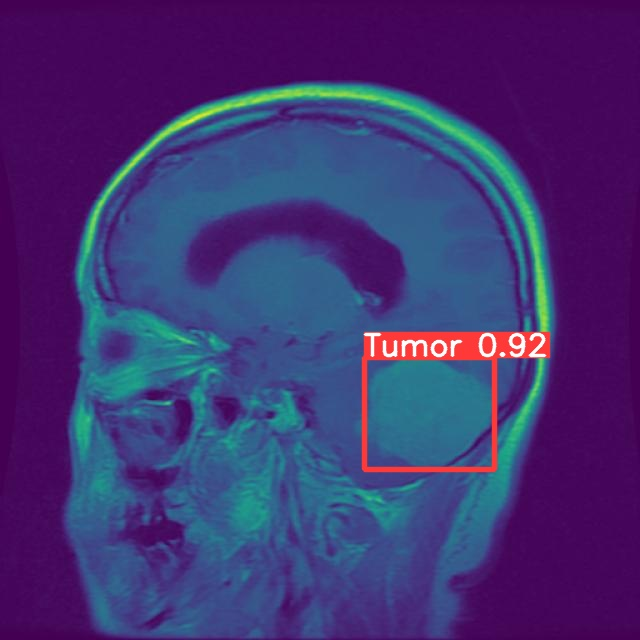

/content/yolov5/runs/detect/exp/2642_png.rf.8fa42dd3c12f1f2b15b33363f7444be7.jpg




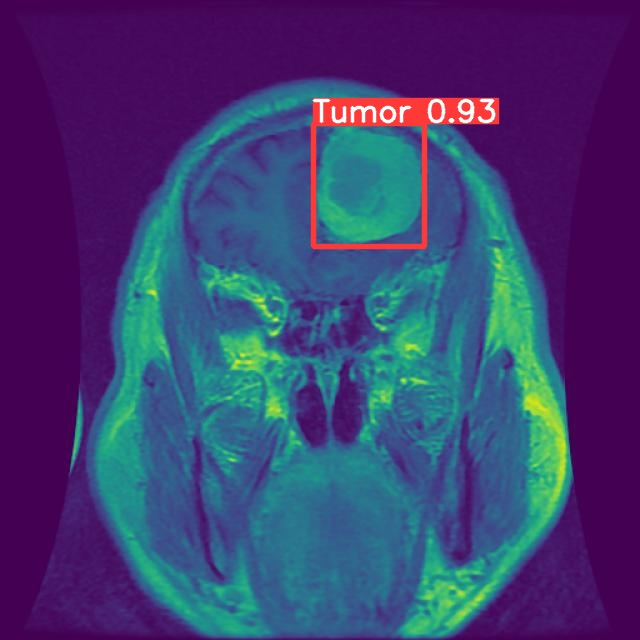

/content/yolov5/runs/detect/exp/3049_png.rf.ee2f5e7a110161250f16f881fb346620.jpg




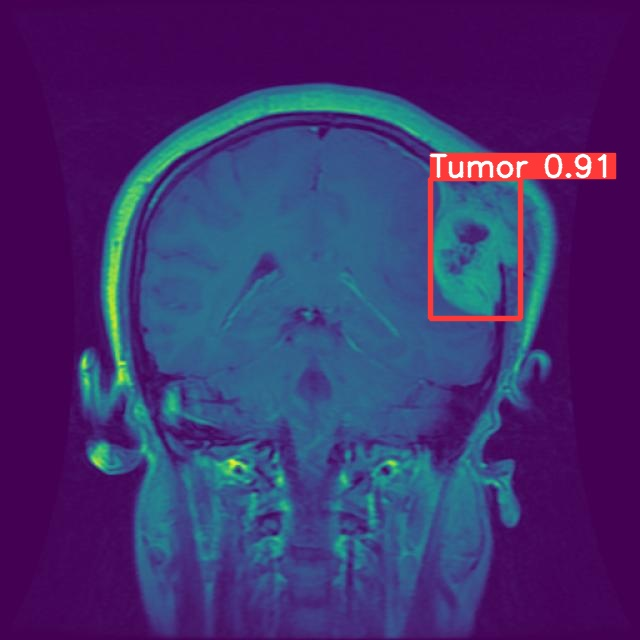

/content/yolov5/runs/detect/exp/3055_png.rf.b9fb975c28fb0031e5db2d2ec539442c.jpg




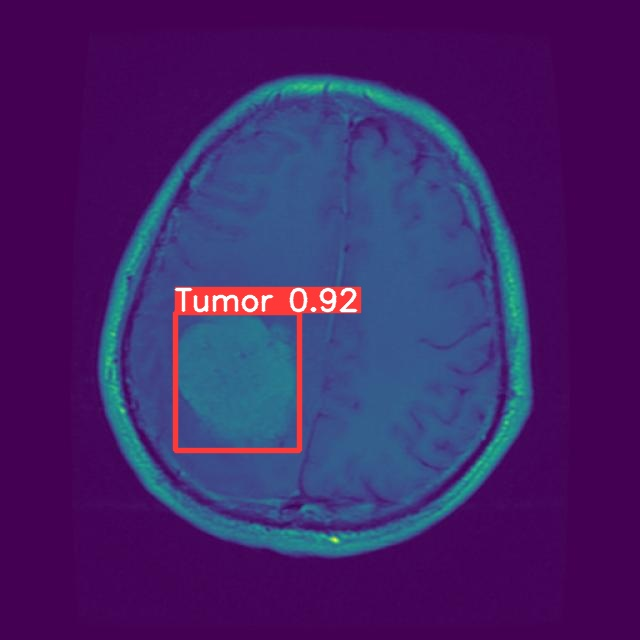

/content/yolov5/runs/detect/exp/2946_png.rf.5103134458e9826d63753dca403a4db9.jpg




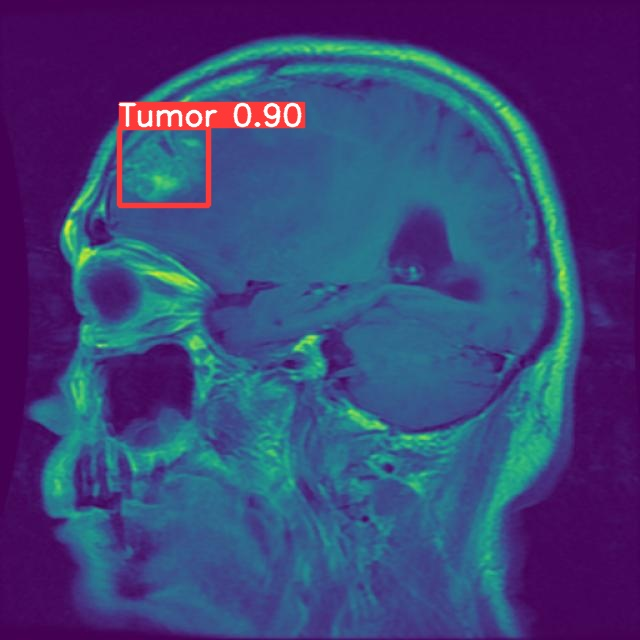

/content/yolov5/runs/detect/exp/2596_png.rf.853e238238af96ecfab9c37546facb44.jpg




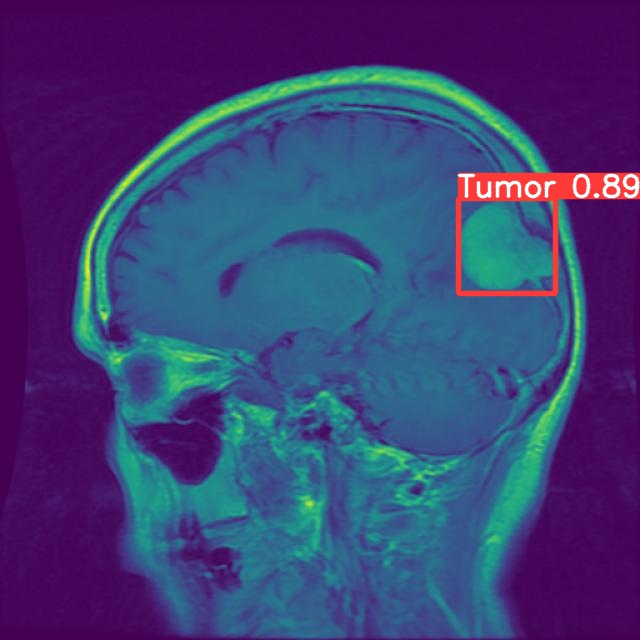

/content/yolov5/runs/detect/exp/2514_png.rf.a1ee3c0edef789e600689d9238321d83.jpg




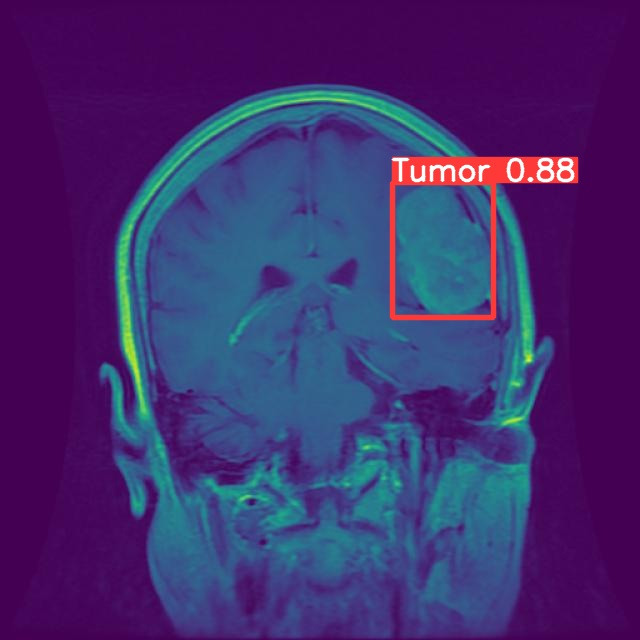

/content/yolov5/runs/detect/exp/3043_png.rf.5cb7868880f100dd73072e6db8bca752.jpg




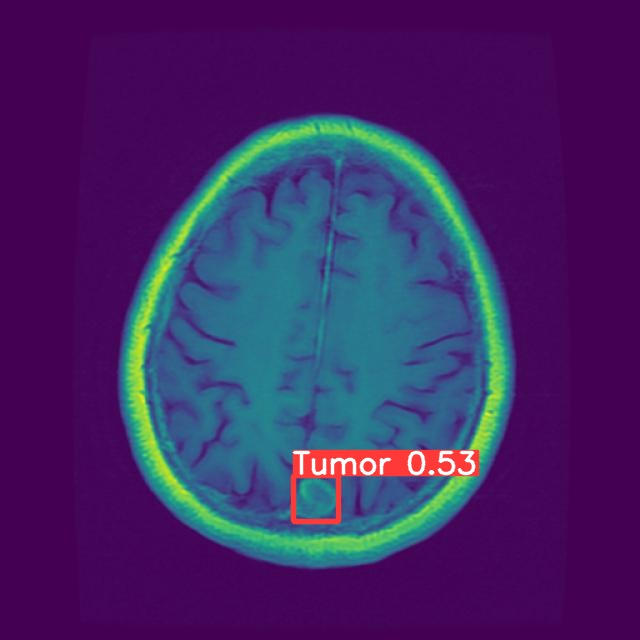

/content/yolov5/runs/detect/exp/2836_png.rf.a987770116a2de26d0d712098a0b8aa3.jpg




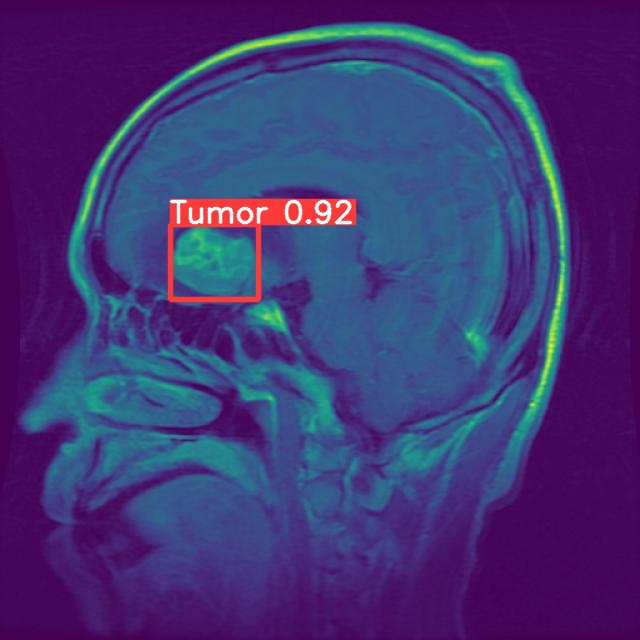

/content/yolov5/runs/detect/exp/2493_png.rf.a11bde29ce810bee0fc5fad13c3fef8e.jpg




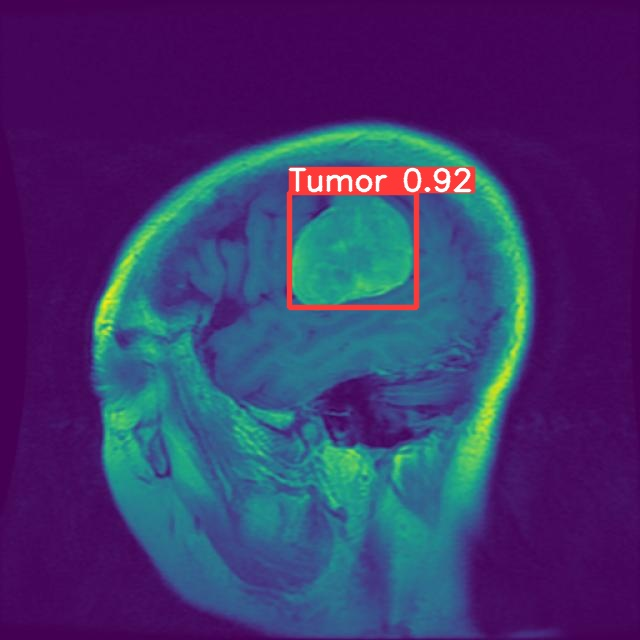

/content/yolov5/runs/detect/exp/2507_png.rf.b7d4ef39a6d19323e8c413c10ba6c02b.jpg




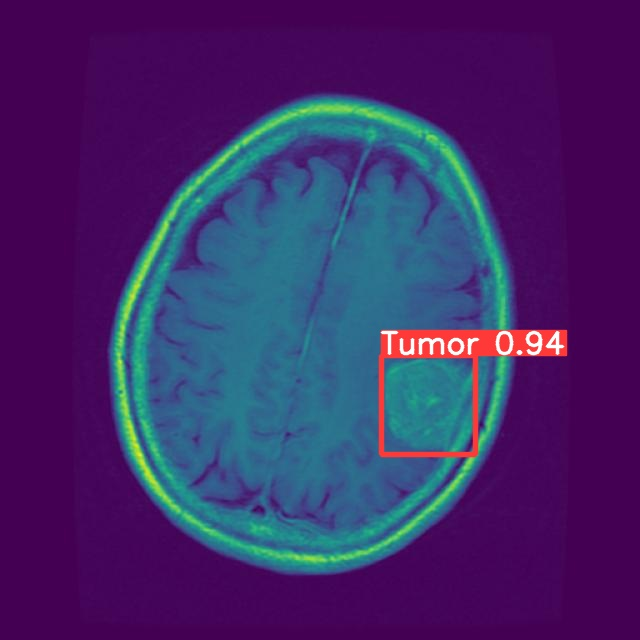

/content/yolov5/runs/detect/exp/2793_png.rf.9680f51598bb507ff4c3eb00d3ff5cb8.jpg




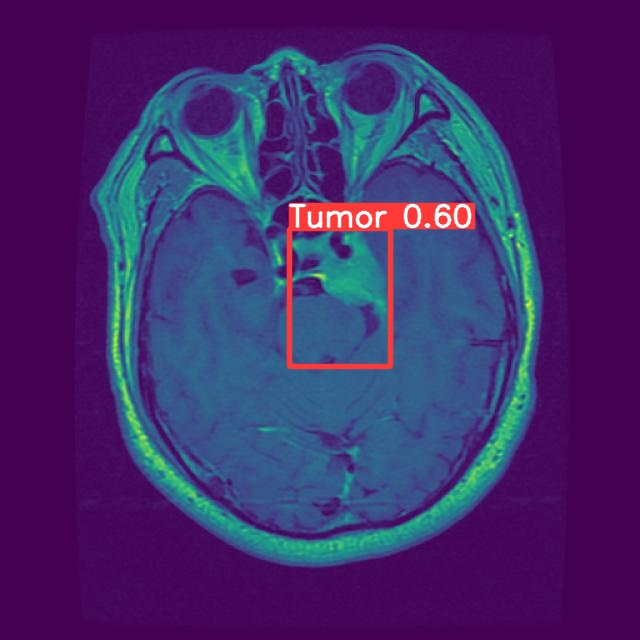

/content/yolov5/runs/detect/exp/2788_png.rf.8f5ccfa160d12dd014e8f8e32f583116.jpg




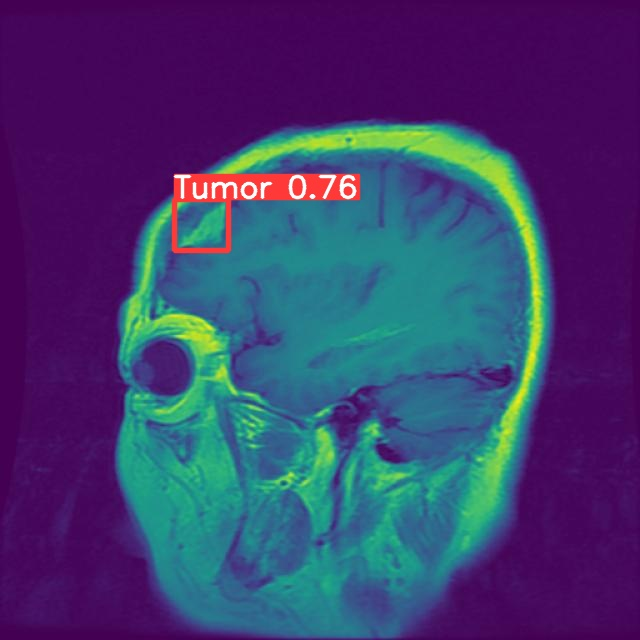

/content/yolov5/runs/detect/exp/2463_png.rf.046976a26878d699fada77cdf89c9698.jpg




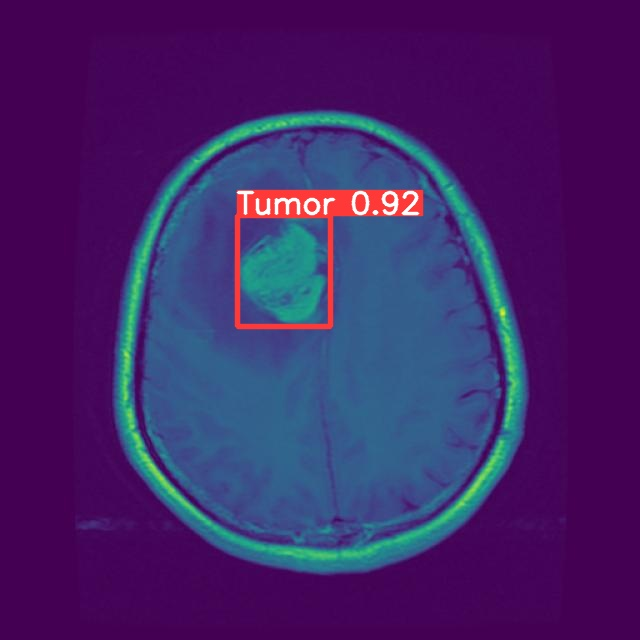

/content/yolov5/runs/detect/exp/2857_png.rf.7e1e24a59ead19a137959a066d180083.jpg




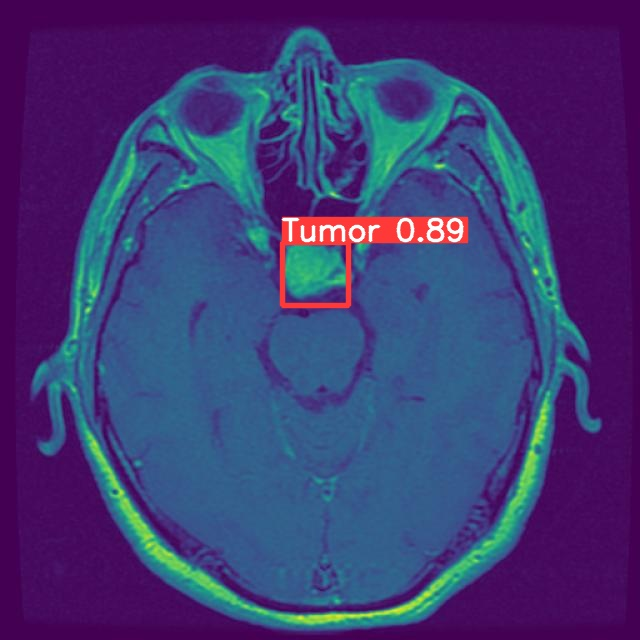

/content/yolov5/runs/detect/exp/2812_png.rf.e568be940dd3ba4bf57456302d4f9810.jpg




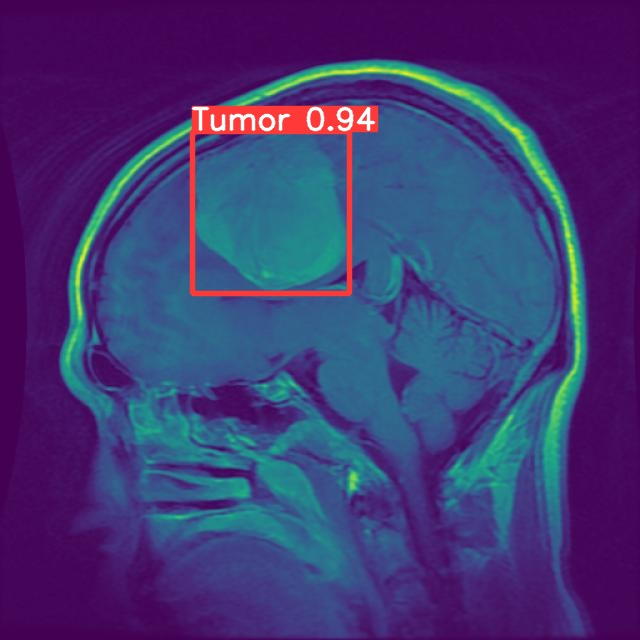

/content/yolov5/runs/detect/exp/2528_png.rf.02ead27b37a8edf4560942b2ce854c6d.jpg




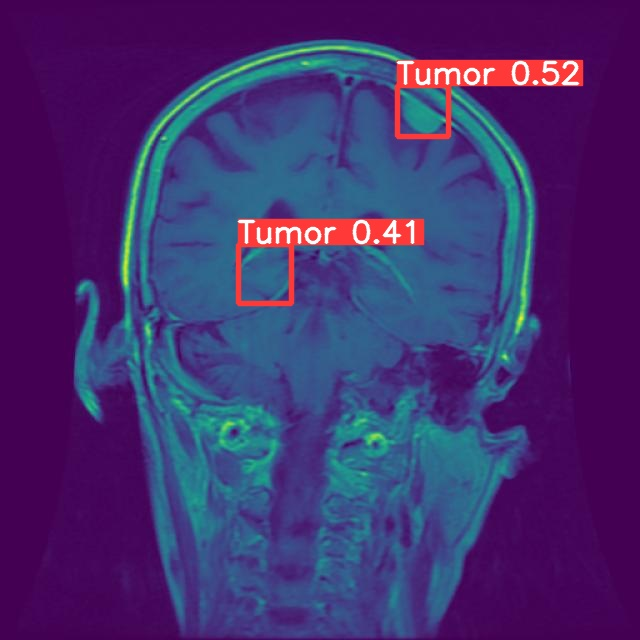

/content/yolov5/runs/detect/exp/3038_png.rf.a7d632d2f514f59ab059d69682906556.jpg




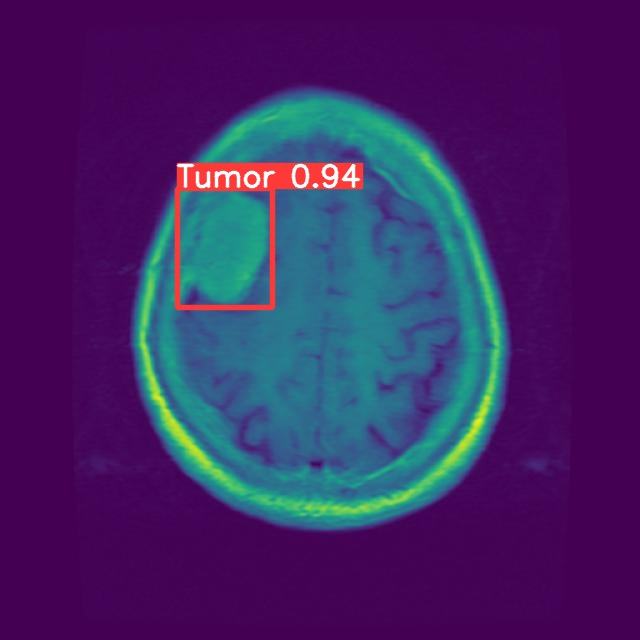

/content/yolov5/runs/detect/exp/2801_png.rf.71486a8c0ec8f4a05b0d3321aa2021b9.jpg




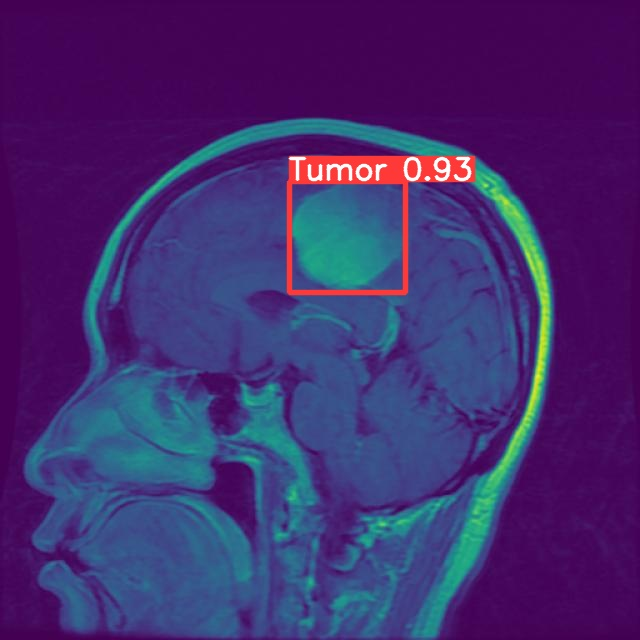

/content/yolov5/runs/detect/exp/2438_png.rf.829daa3f9ea3abe0722e2c92ff97771b.jpg




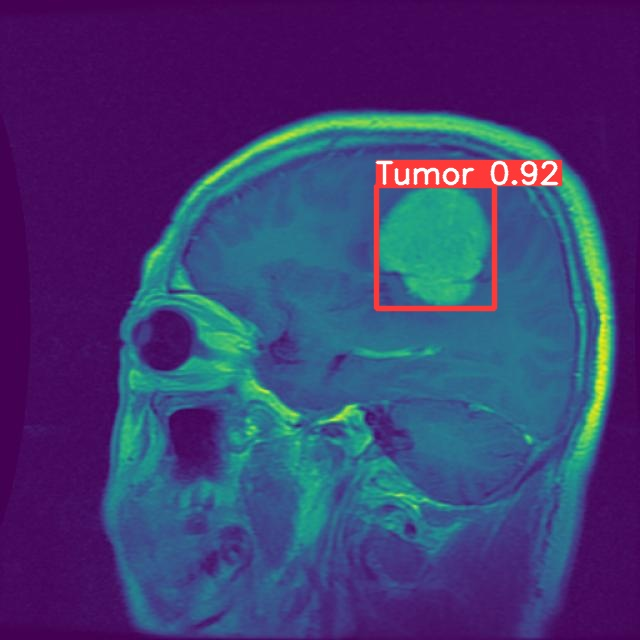

/content/yolov5/runs/detect/exp/2704_png.rf.57c82c7f01e6118c4180f4ea7246170e.jpg




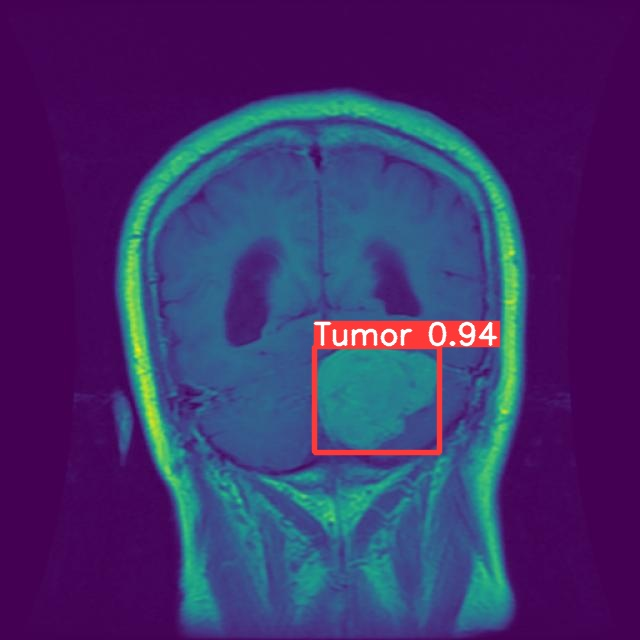

/content/yolov5/runs/detect/exp/2303_png.rf.3ddeab9a60be2bfdc0e3b8b575a32e2e.jpg




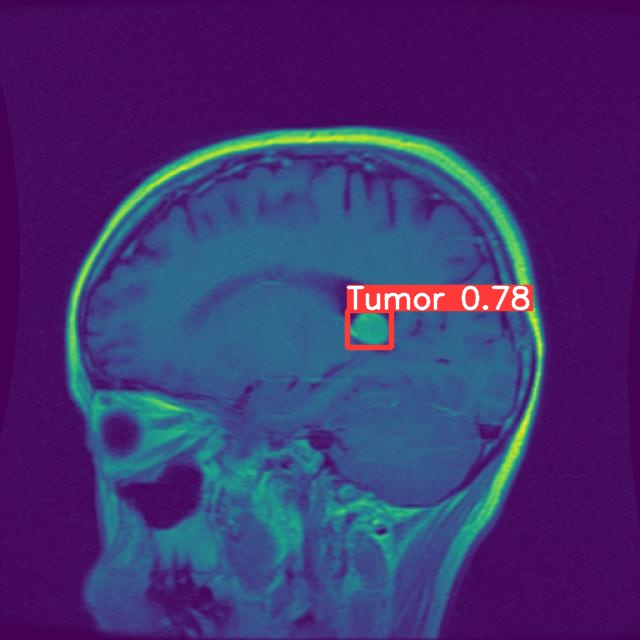

/content/yolov5/runs/detect/exp/2675_png.rf.2299153248a3f051d71ceac88c3bf49b.jpg




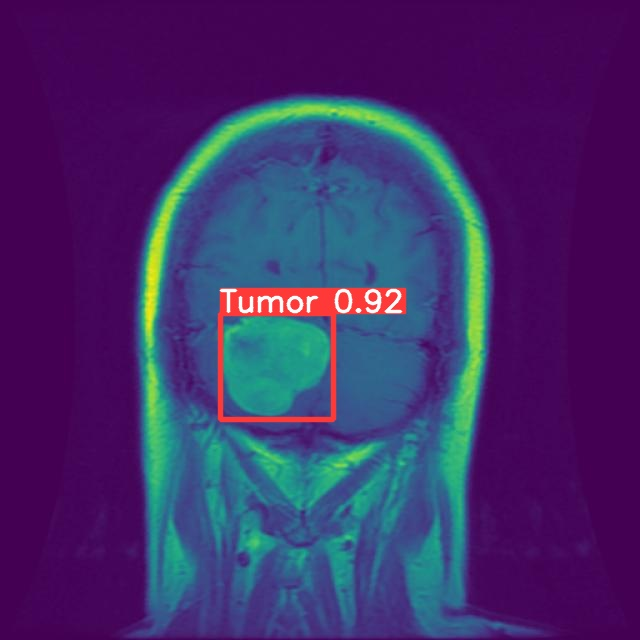

/content/yolov5/runs/detect/exp/2408_png.rf.b105623b9d2104adc31103d59706b7f3.jpg




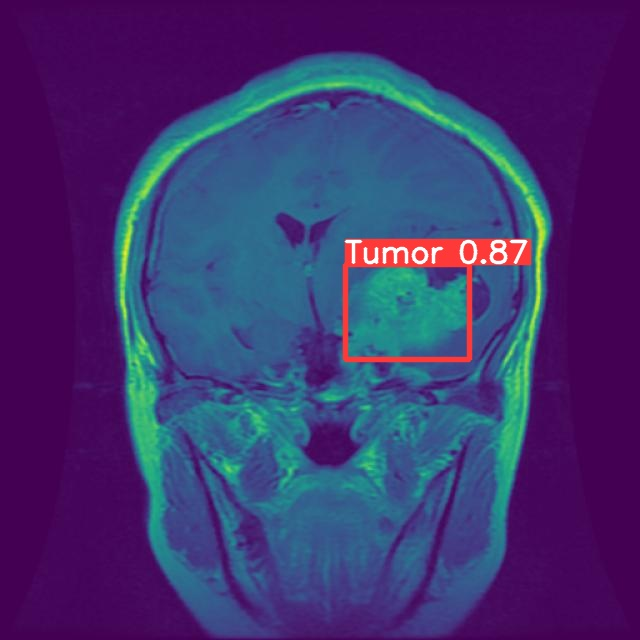

/content/yolov5/runs/detect/exp/2977_png.rf.53282065549ff4fd6c93f6515b65805d.jpg




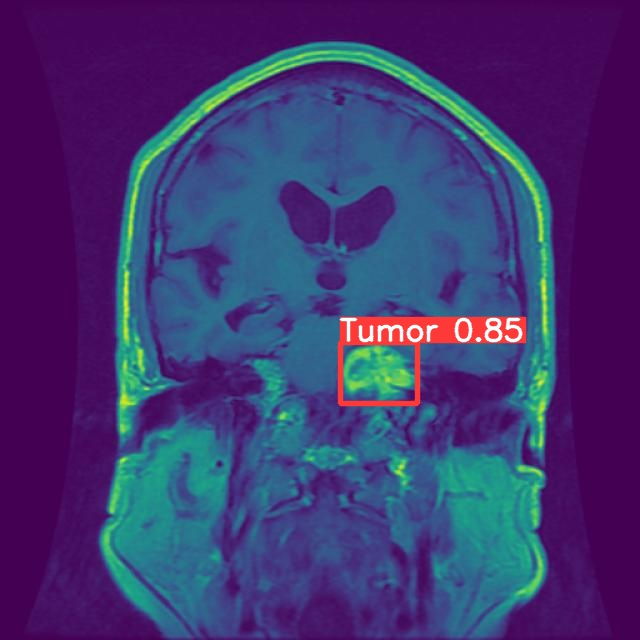

/content/yolov5/runs/detect/exp/3028_png.rf.ec24eb88d1e19a7cbd7420eb3000f9a4.jpg




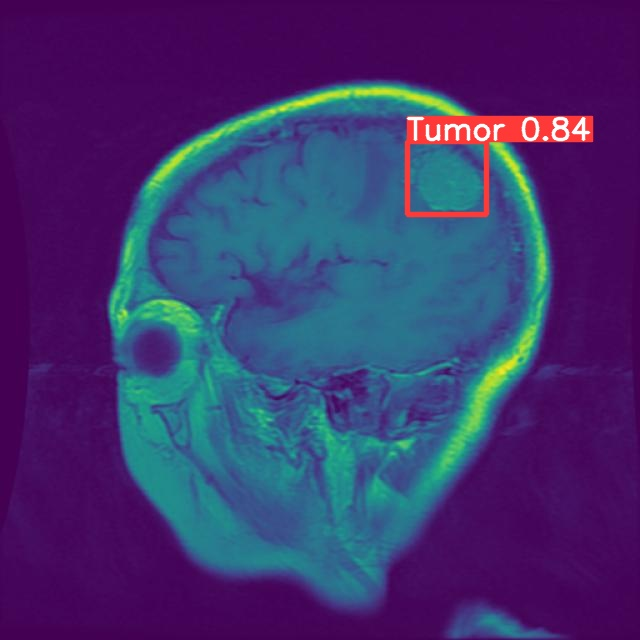

/content/yolov5/runs/detect/exp/2701_png.rf.d2004ee619246c095d9142c5c66df029.jpg




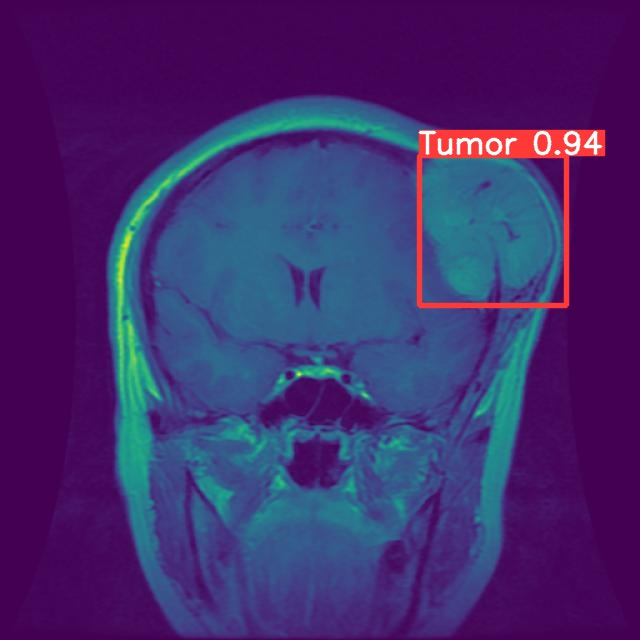

/content/yolov5/runs/detect/exp/3056_png.rf.1fd642ba40feedcd167b0b5c0b22a195.jpg




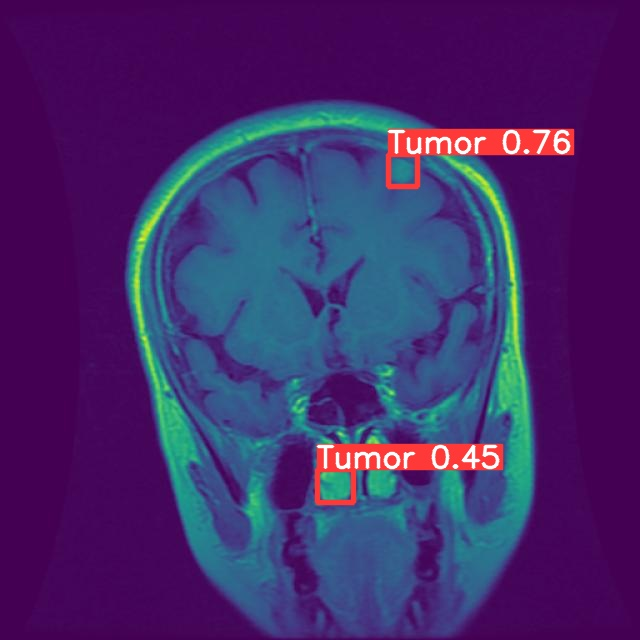

/content/yolov5/runs/detect/exp/2416_png.rf.2e5f3dde5d7aae01b886b0c81db3c67f.jpg




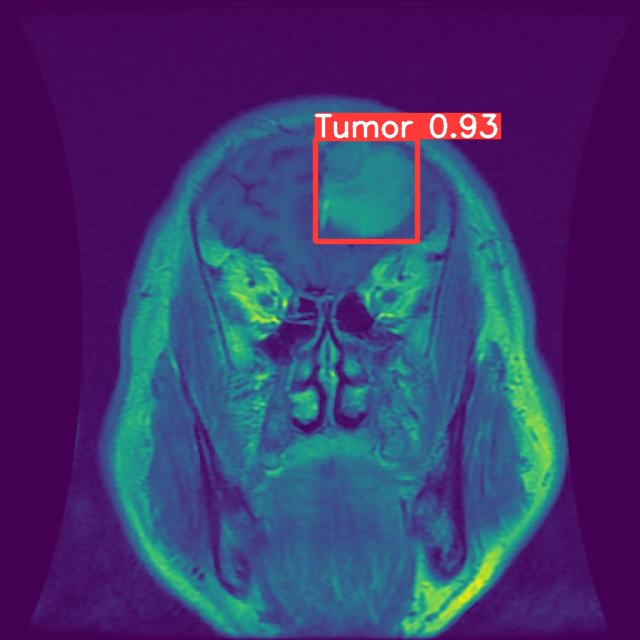

/content/yolov5/runs/detect/exp/3035_png.rf.8e9ef2191b121111dd256d1a309cd5ed.jpg




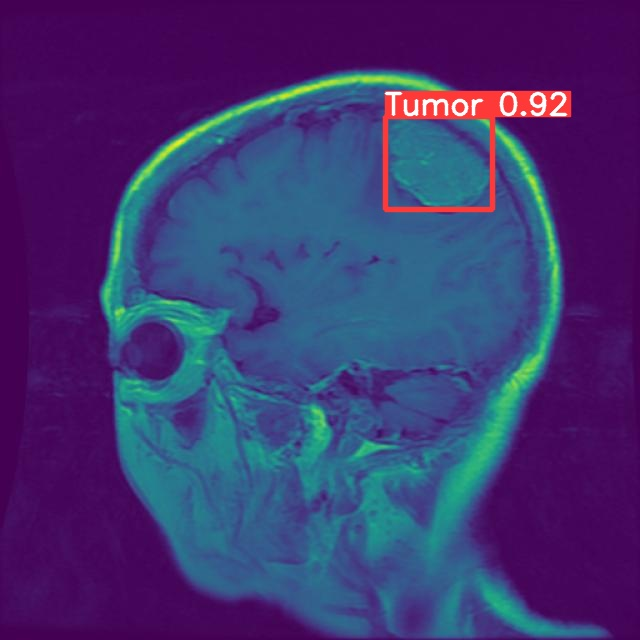

/content/yolov5/runs/detect/exp/2706_png.rf.0c13cab9f1406352be20870611a19e92.jpg




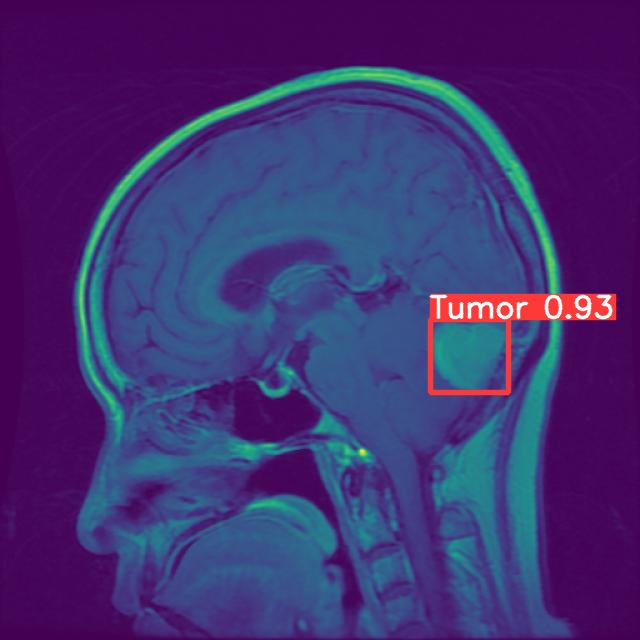

/content/yolov5/runs/detect/exp/2692_png.rf.6a324481d08a8cc77c0de9256b50f53e.jpg




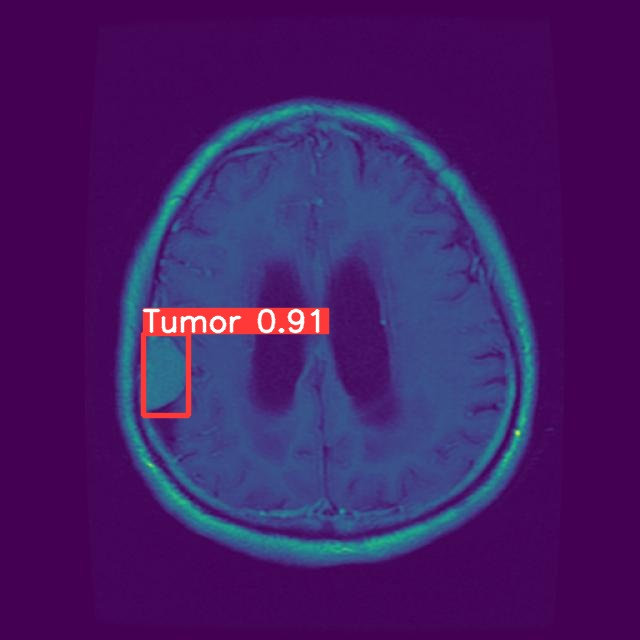

/content/yolov5/runs/detect/exp/456_png.rf.63ed538be112e305a6ad5dd07350855e.jpg




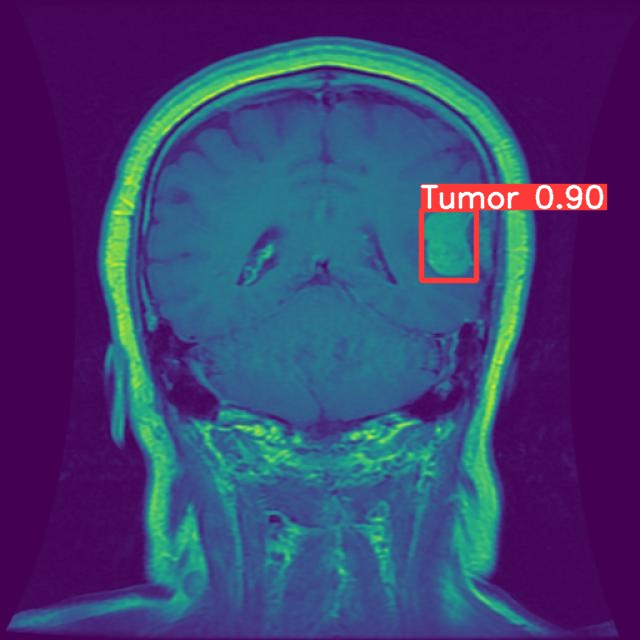

/content/yolov5/runs/detect/exp/2340_png.rf.c9ecaae144c8e3947e89e1fe0ff0d361.jpg




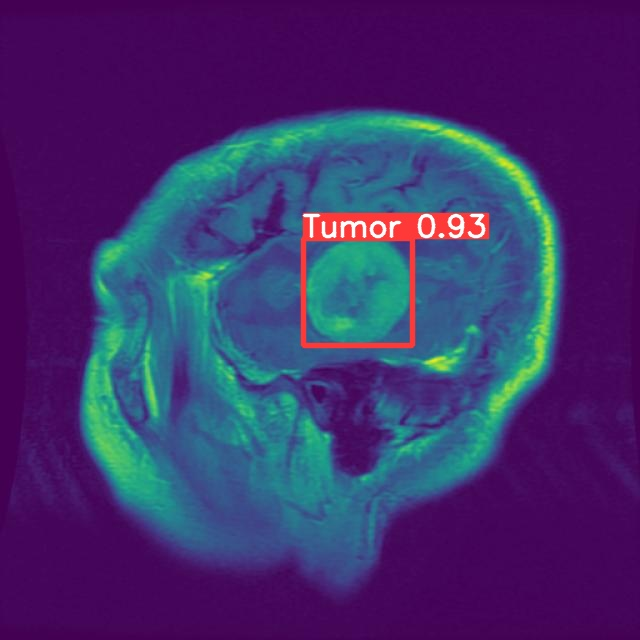

/content/yolov5/runs/detect/exp/2630_png.rf.54a3b5032b6fde80c78ef876ac14005d.jpg




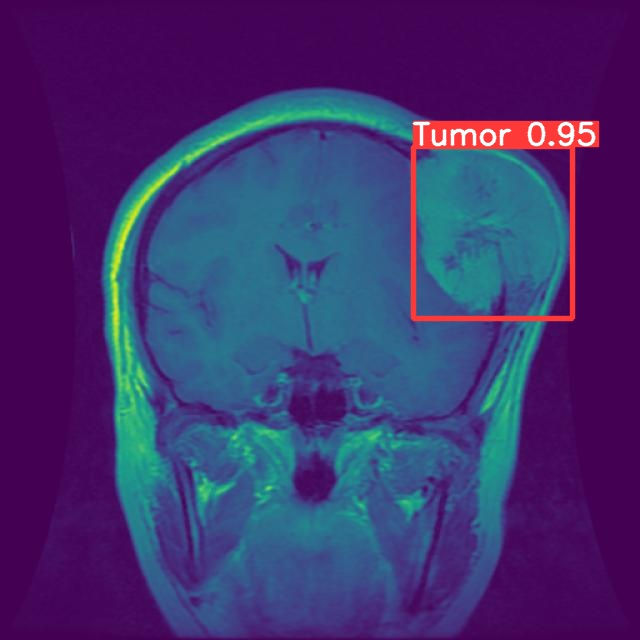

/content/yolov5/runs/detect/exp/2302_png.rf.e89b91def373175ba5e81758884e7a32.jpg




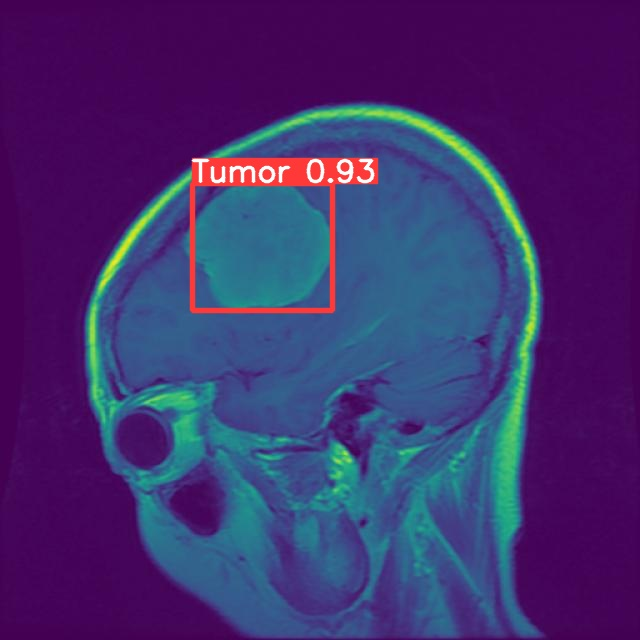

/content/yolov5/runs/detect/exp/2645_png.rf.8a70322b97ef7b4b73053b0de7aac9f9.jpg




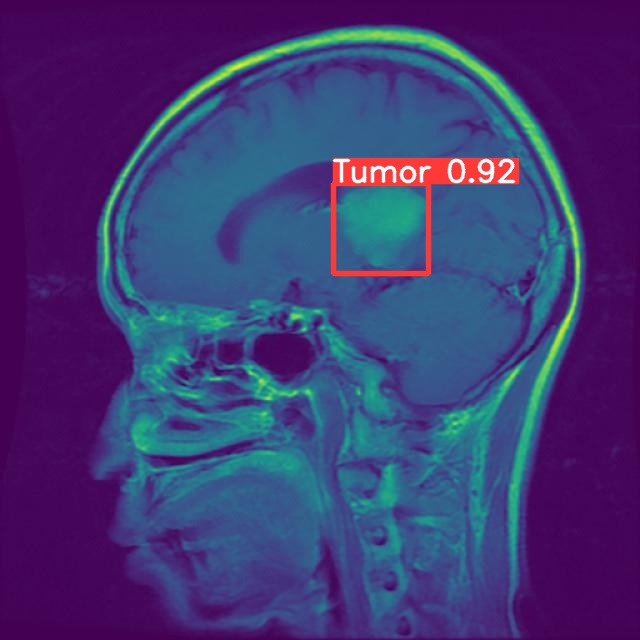

/content/yolov5/runs/detect/exp/2466_png.rf.6cc1b1f44dc7bf43e2c852095718d9b9.jpg




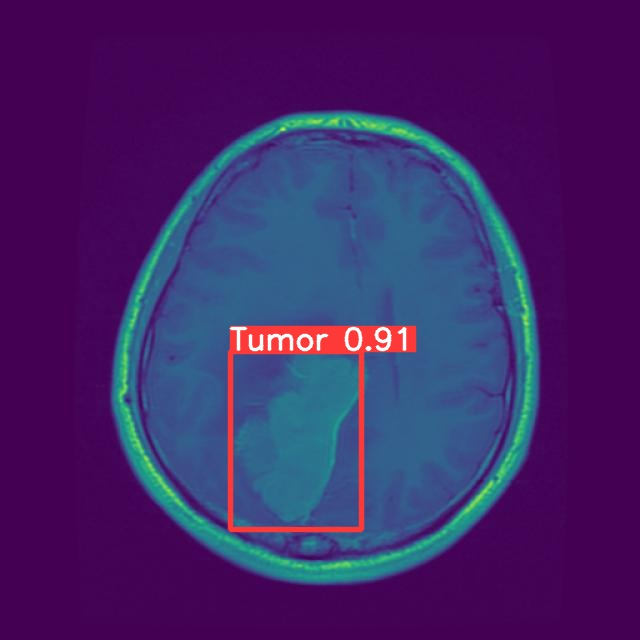

/content/yolov5/runs/detect/exp/2939_png.rf.4d6cdef01d2af317f2e8468f0ce69b9a.jpg




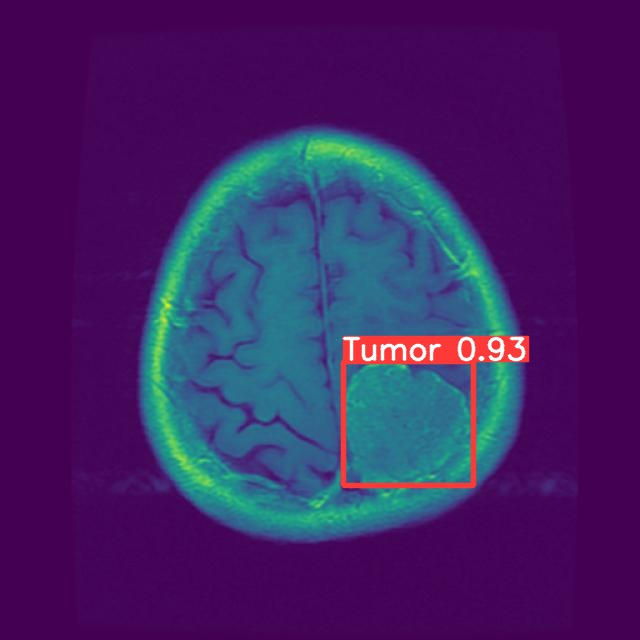

/content/yolov5/runs/detect/exp/2953_png.rf.41a35ea9723f2c5af6e312654929fa55.jpg




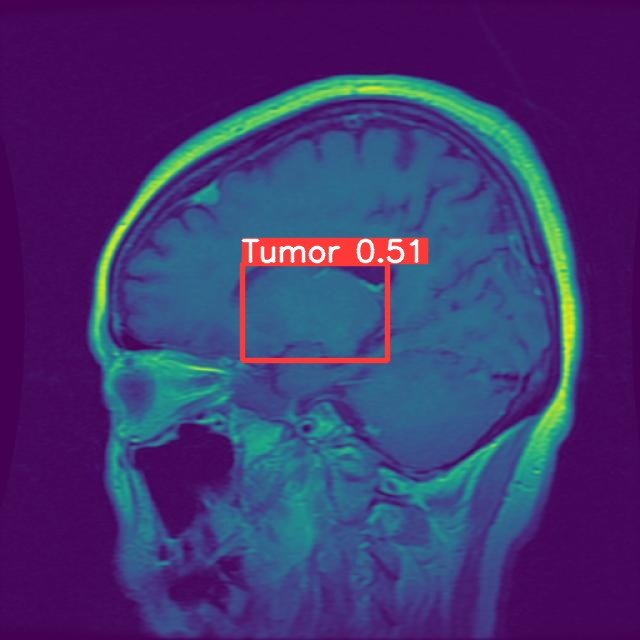

/content/yolov5/runs/detect/exp/2580_png.rf.91a4f25a54a913e06db4591d4e5a268c.jpg




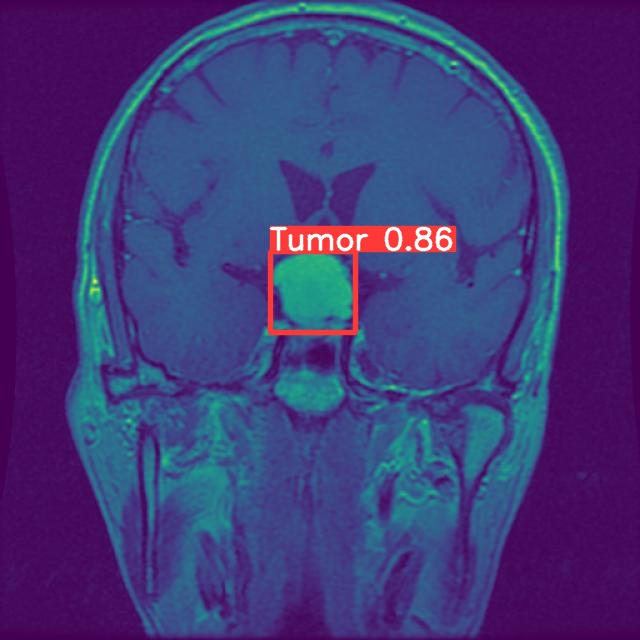

/content/yolov5/runs/detect/exp/3008_png.rf.33d0ba41cd48419c386f23be566c8e39.jpg




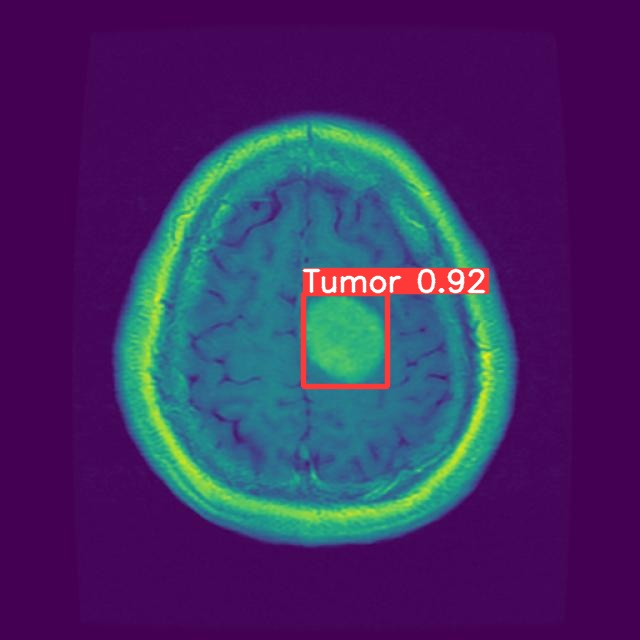

/content/yolov5/runs/detect/exp/2827_png.rf.14df2fdf1cd42833abd7b4abfa4eee10.jpg




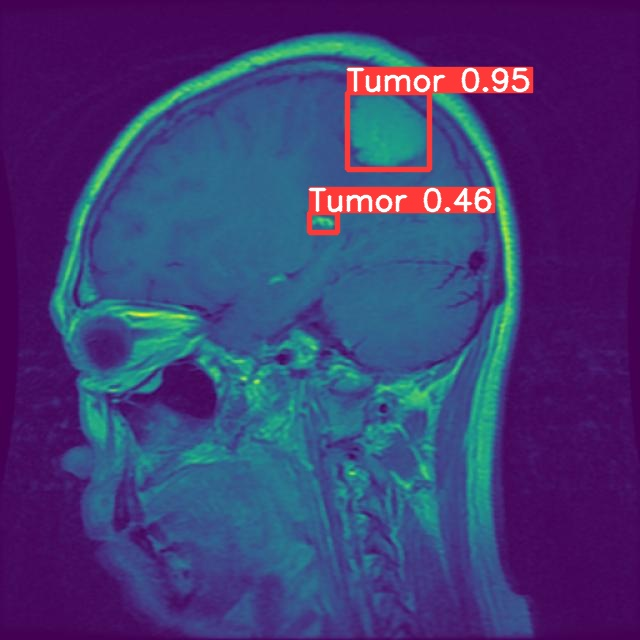

/content/yolov5/runs/detect/exp/2662_png.rf.73b0f69dec28b6ca0952160b0ddd3104.jpg




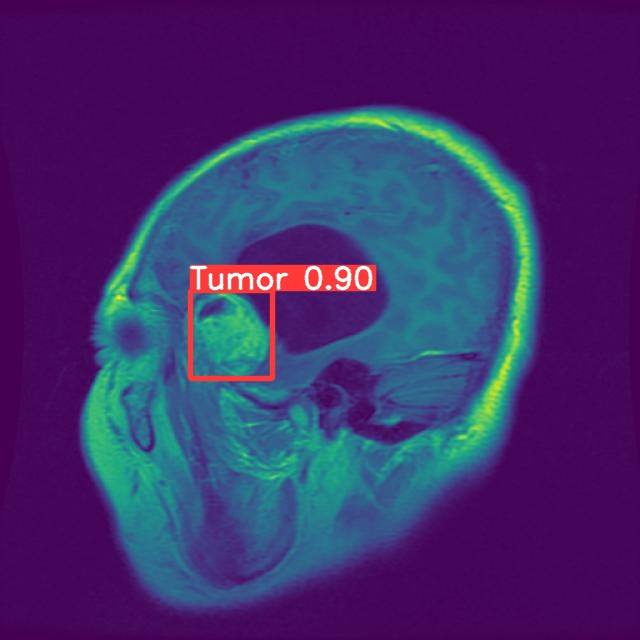

/content/yolov5/runs/detect/exp/2609_png.rf.13e4aeb637dcea941d06255553a6b33b.jpg




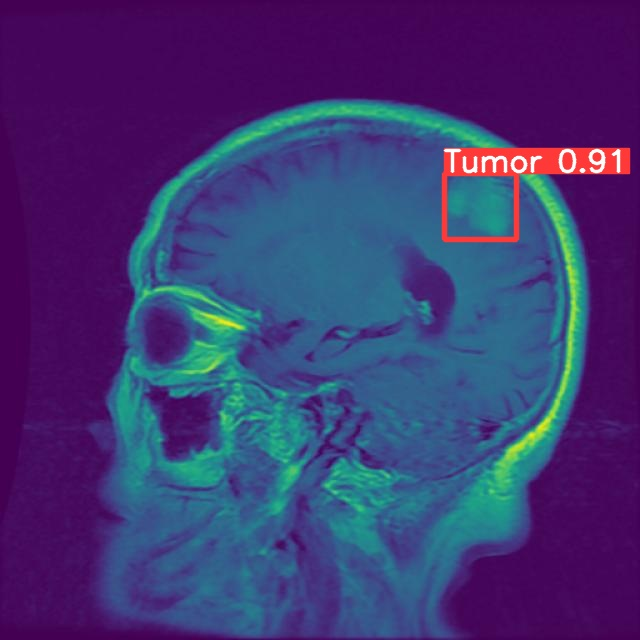

/content/yolov5/runs/detect/exp/2571_png.rf.b682cd778e574fe84bd6b032a3a4c869.jpg




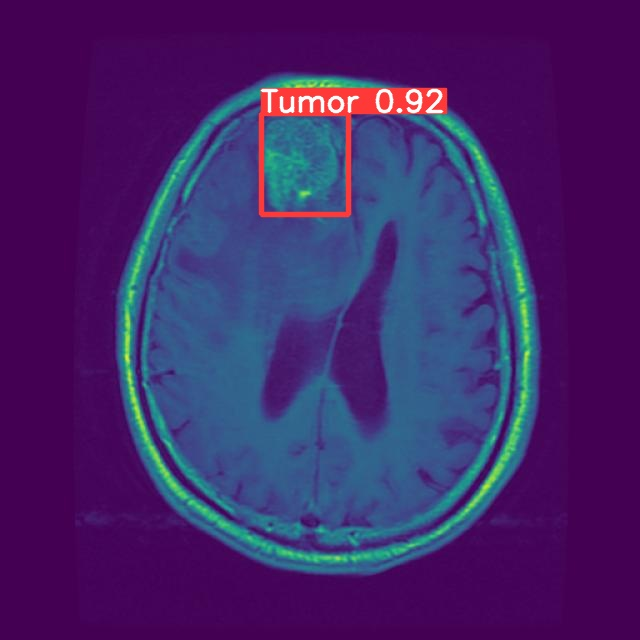

/content/yolov5/runs/detect/exp/2901_png.rf.adc829035acd05ad7d8fbb89d0b1ce8c.jpg




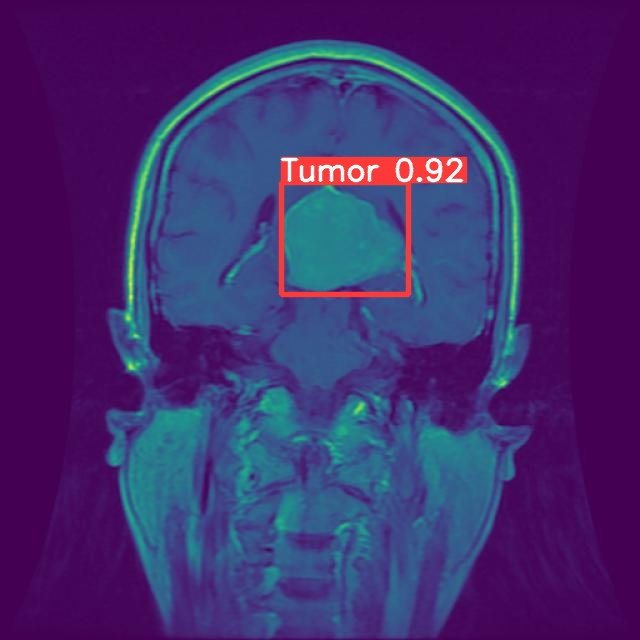

/content/yolov5/runs/detect/exp/2979_png.rf.ad4372abfb9b8babcf7b62db07878071.jpg




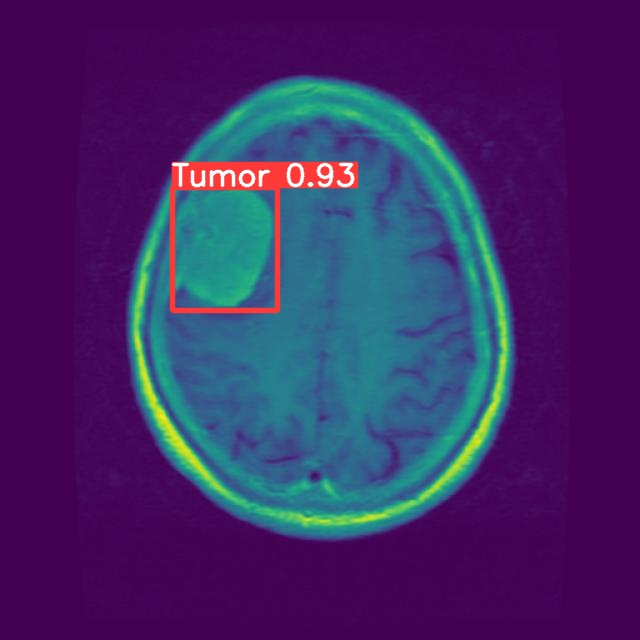

/content/yolov5/runs/detect/exp/2803_png.rf.185e8f69763670d3d91d6a2153051e35.jpg




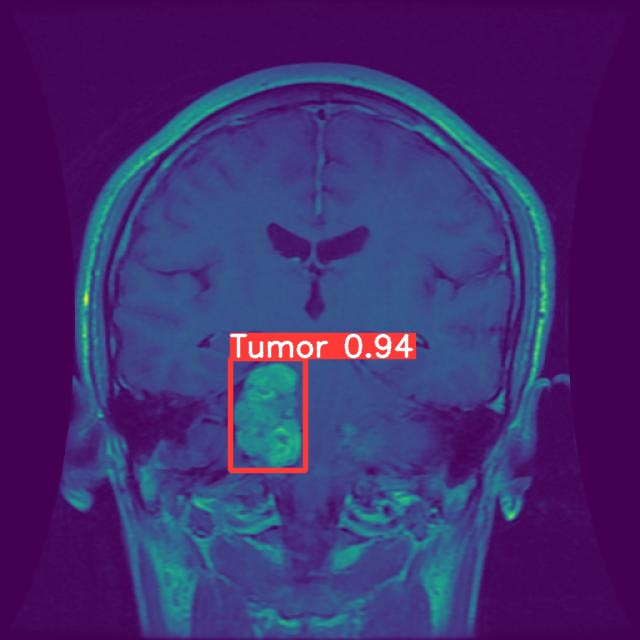

/content/yolov5/runs/detect/exp/2314_png.rf.7e931924bce87a6a2b494e2d4fff2c39.jpg




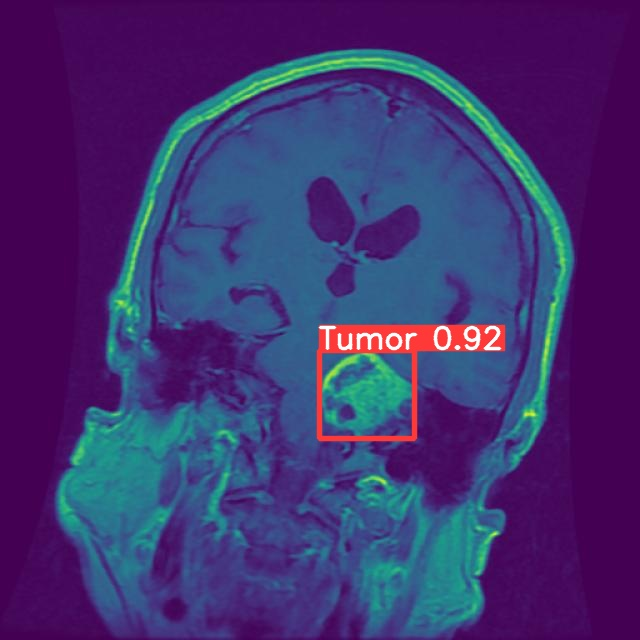

/content/yolov5/runs/detect/exp/3007_png.rf.e3e56b564b1beeffd363d8ce375cdd1b.jpg




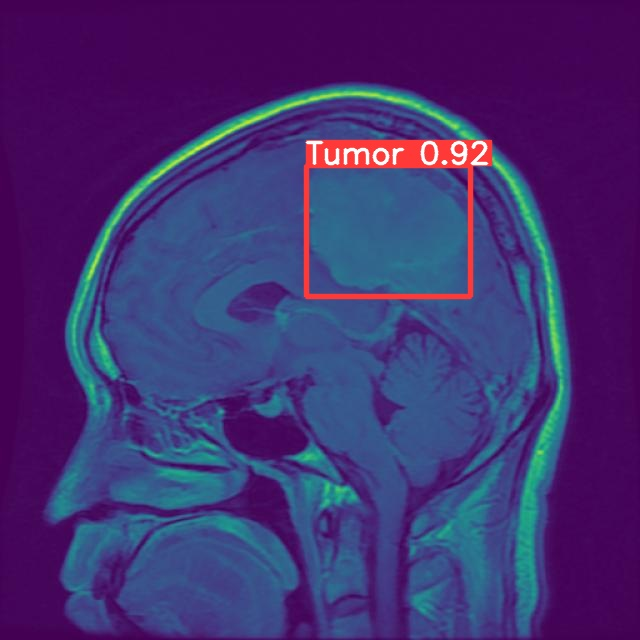

/content/yolov5/runs/detect/exp/2625_png.rf.9269e701d008f53284b3dd06247a9328.jpg




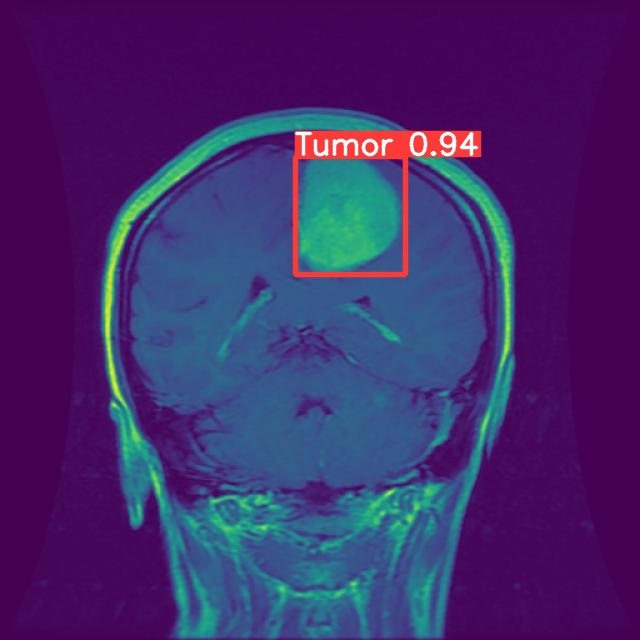

/content/yolov5/runs/detect/exp/2974_png.rf.744ddb65dad81d030e6d4bcecad07ed5.jpg




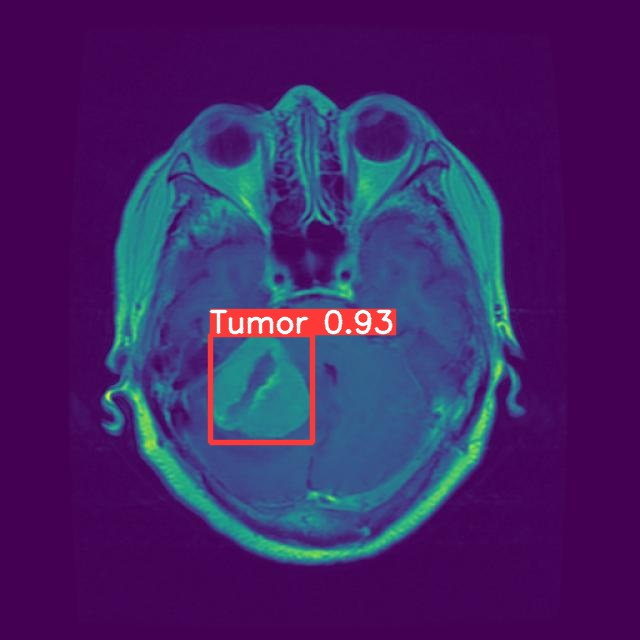

/content/yolov5/runs/detect/exp/2897_png.rf.b0ab1a2fbb089108151b6c536cf0fe5a.jpg




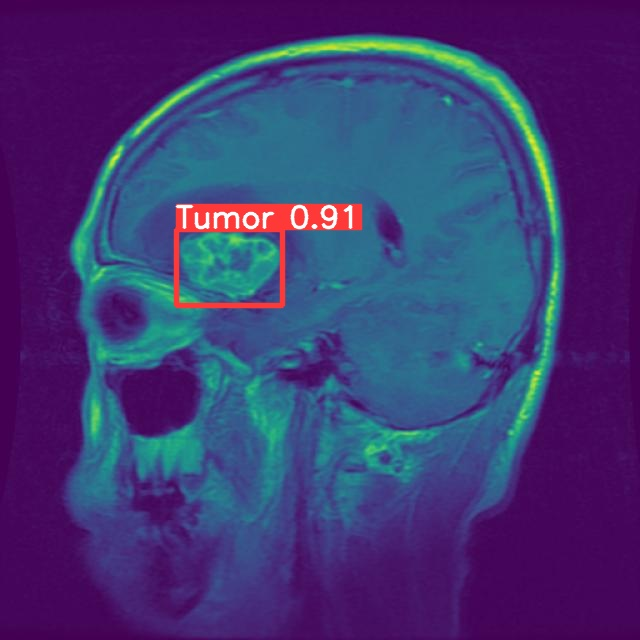

/content/yolov5/runs/detect/exp/2494_png.rf.1e2d3c71de283835b38122f4b620a50c.jpg




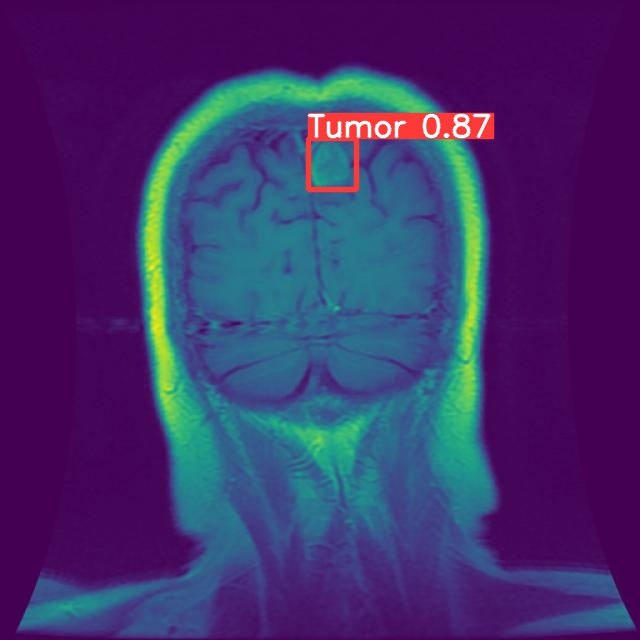

/content/yolov5/runs/detect/exp/2317_png.rf.bd70cc4fe2b4d4303a1f0a5a15eb97ec.jpg




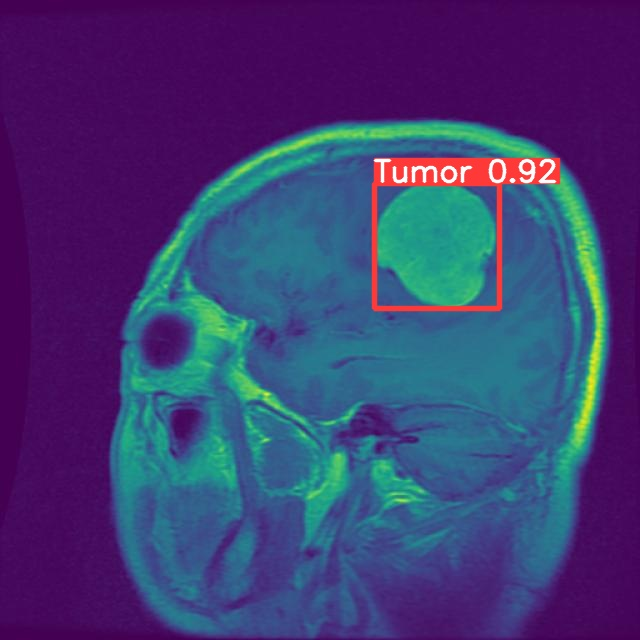

/content/yolov5/runs/detect/exp/2695_png.rf.5e7776864aef293710c4431643b15fd5.jpg




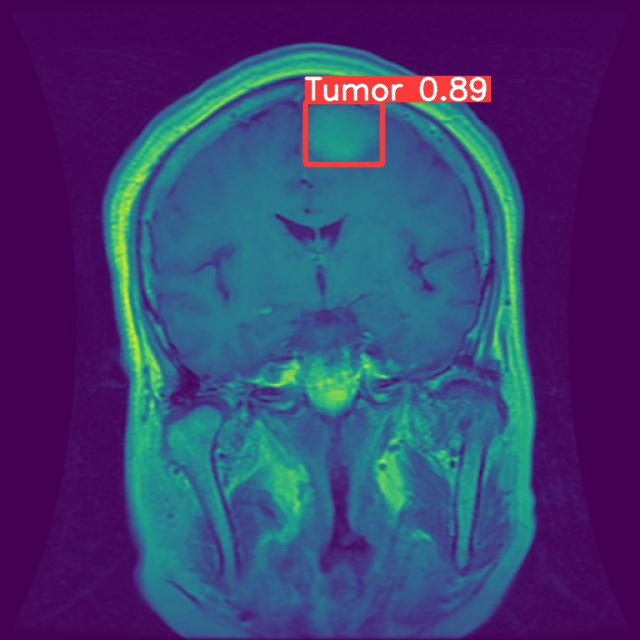

/content/yolov5/runs/detect/exp/3037_png.rf.3eef13714fe9a6dee1e63abbefb1ac2c.jpg




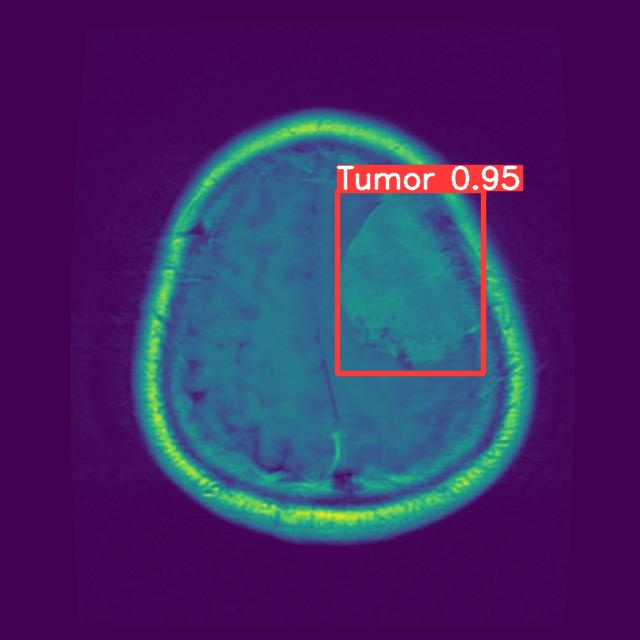

/content/yolov5/runs/detect/exp/2884_png.rf.1e97374c6b675b519ac22aed967bb998.jpg




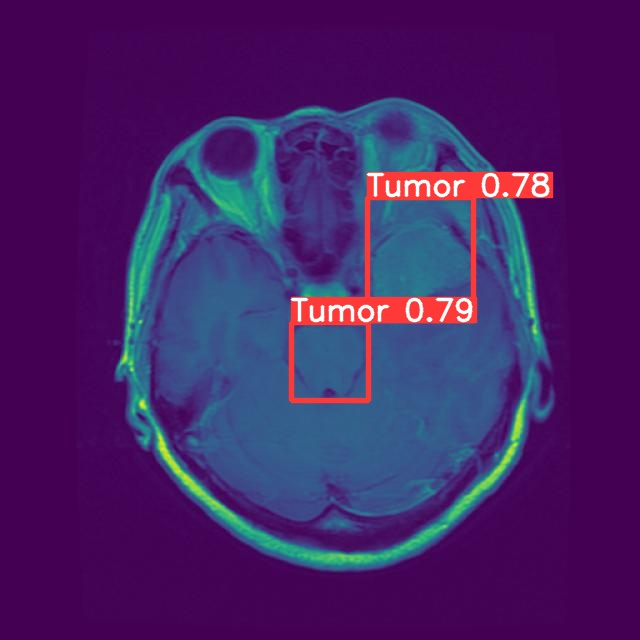

/content/yolov5/runs/detect/exp/2895_png.rf.78414f84f8b563132026b4006778903c.jpg




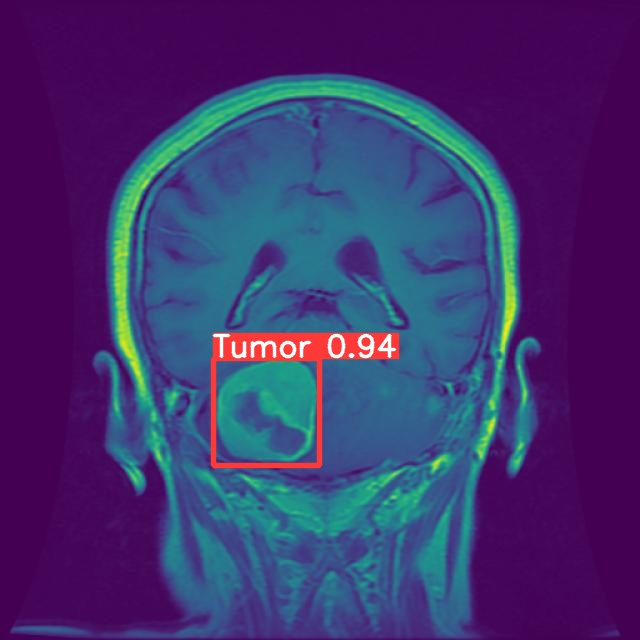

/content/yolov5/runs/detect/exp/2320_png.rf.8f2e91bade508c5719c1b09edc13adca.jpg




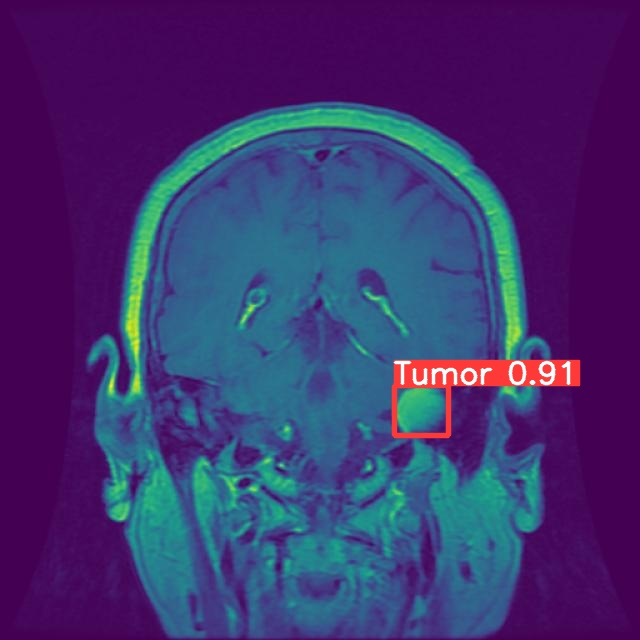

/content/yolov5/runs/detect/exp/3036_png.rf.8f5a60fbc48ed143dc4bed8341943e3a.jpg




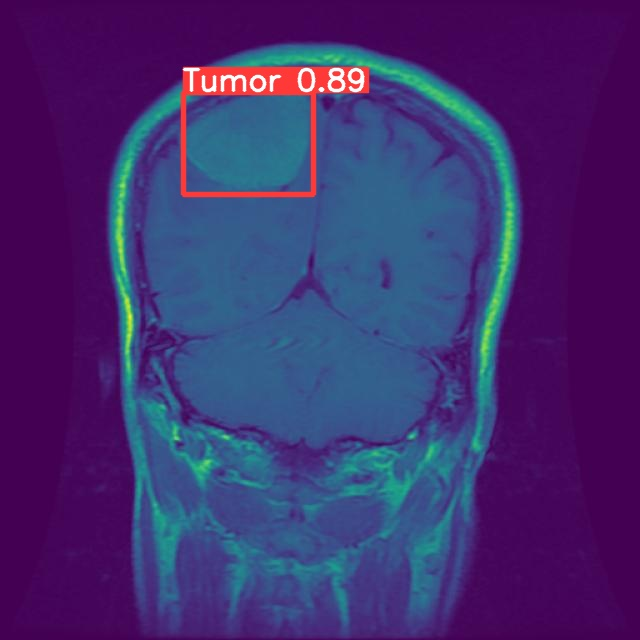

/content/yolov5/runs/detect/exp/2454_png.rf.5d5d152df666543b781faf571240cb8f.jpg




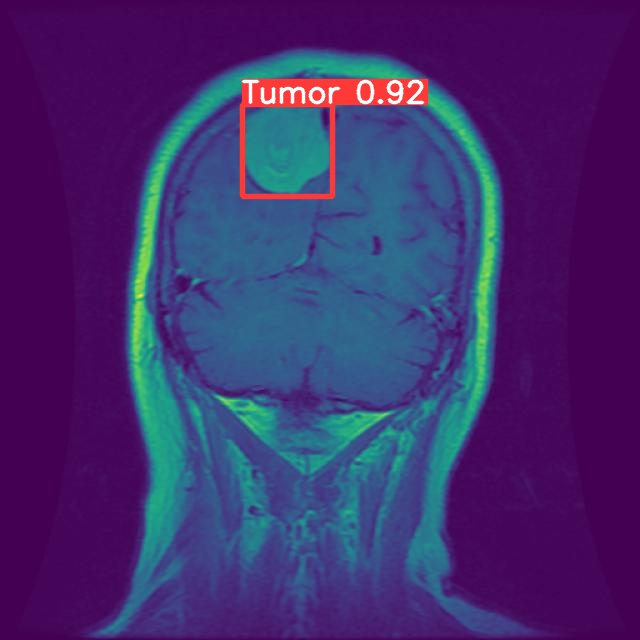

/content/yolov5/runs/detect/exp/2389_png.rf.d23ba7621539b35863e0fbc0659fd855.jpg




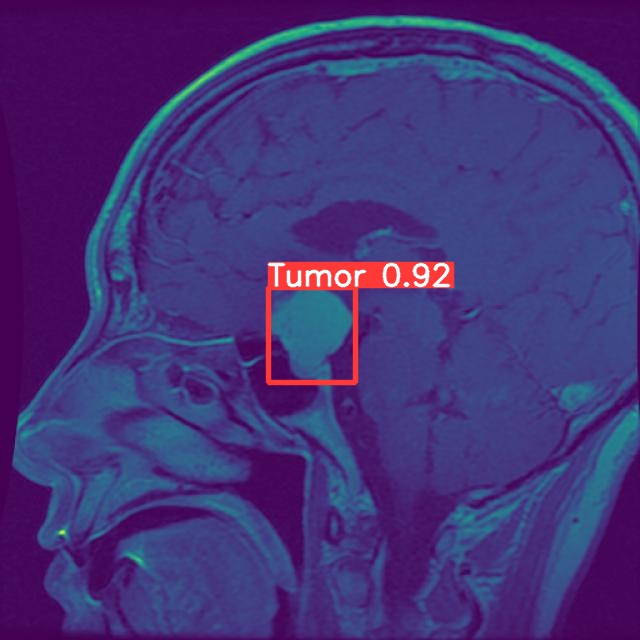

/content/yolov5/runs/detect/exp/2492_png.rf.65076b1b2381d038dc5d0c351052fd5f.jpg




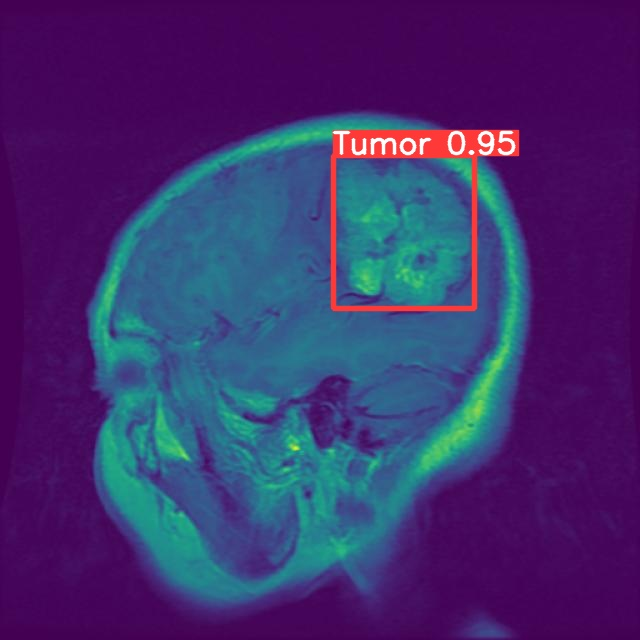

/content/yolov5/runs/detect/exp/2543_png.rf.bb0b10a26882096cbb32f02ede1aab61.jpg




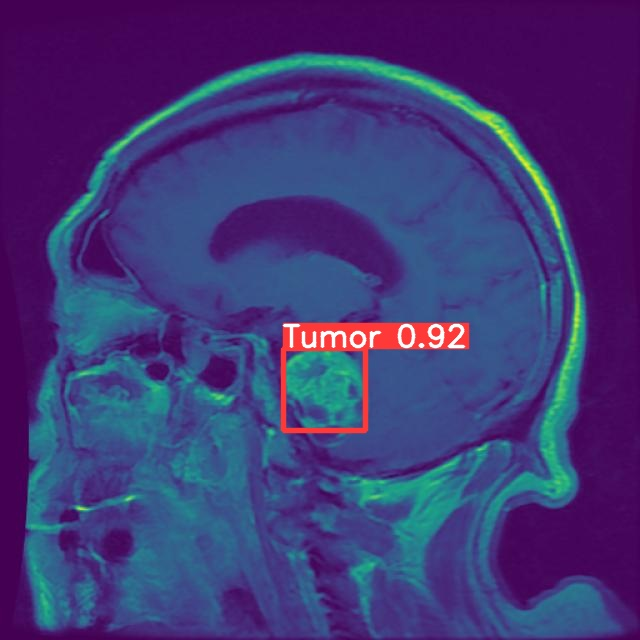

/content/yolov5/runs/detect/exp/2481_png.rf.d531ab707c2fd0ecbc7541e9df257fef.jpg




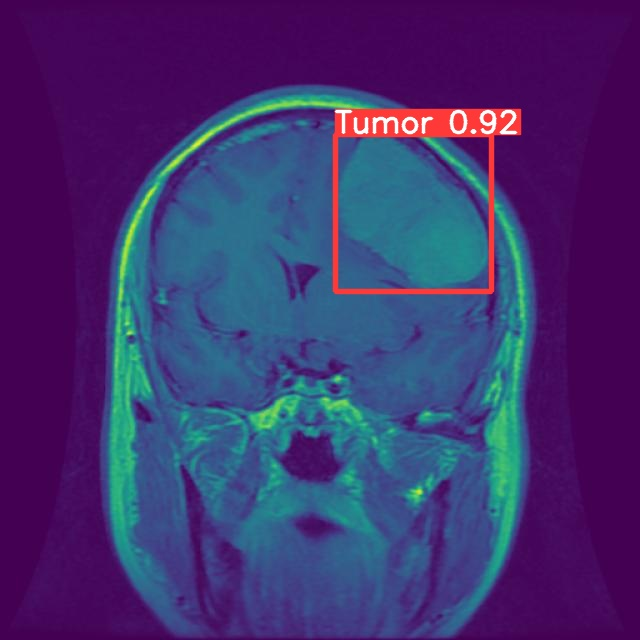

/content/yolov5/runs/detect/exp/2365_png.rf.f06c7072e92c02a140dfe4f5620e3ad5.jpg




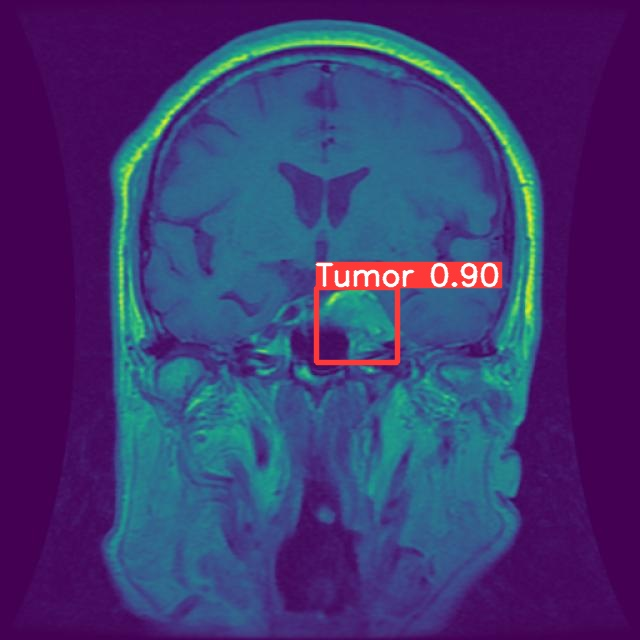

/content/yolov5/runs/detect/exp/2996_png.rf.d0430665a46b36a094a5920f7eb4cd55.jpg




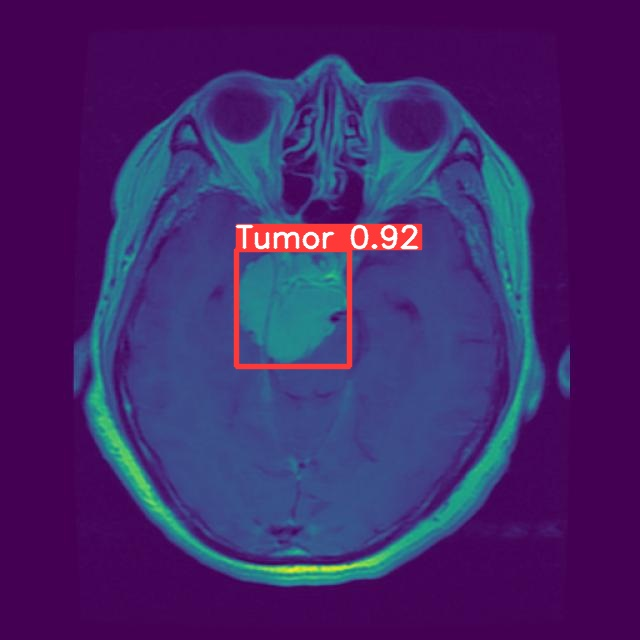

/content/yolov5/runs/detect/exp/2937_png.rf.fa0dc5bfc9d7bf943230a847b17073ff.jpg




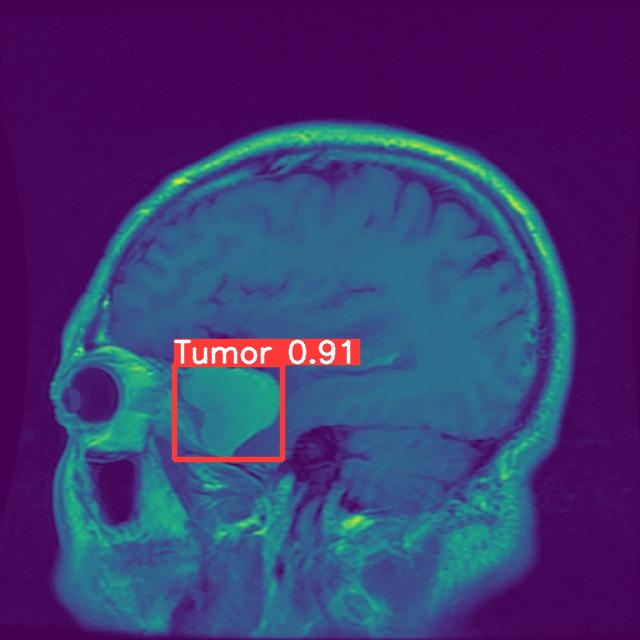

/content/yolov5/runs/detect/exp/2483_png.rf.df2c039c6c6099107c4e5bb5a3dc60dc.jpg




In [26]:
# mostramos los resultados en todas las imágenes de prueba

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print(imageName)
    print("\n")

# Almacenar pesos de modelo directamente en Roboflow

In [27]:
dataset.version

'5'

In [28]:
project.version(dataset.version).deploy(model_type="yolov5", model_path=f"/content/yolov5/runs/train/yolov5s_results/")

An error occured when getting the model upload URL: This version already has a trained model. Please generate and train a new version in order to upload model to Roboflow.


In [ ]:
#Run inference on your model on a persistant, auto-scaling, cloud API
#from PIL import Image, ImageDraw, ImageFont

#load model
#model = project.version(dataset.version).model

#choose random test set image
#import os, random
#test_set_loc = dataset.location + "/test/images/"
#random_test_image = random.choice(os.listdir(test_set_loc))
#print("running inference on " + random_test_image)

#pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
#pred

#print(pred)

#detections = pred['predictions']
# f = './[YOUR-IMAGE].jpg'
#f = test_set_loc + random_test_image
#image = Image.open(f)

#draw = ImageDraw.Draw(image)
#font = ImageFont.load_default()

#for box in detections:
#   color = "#4892EA"
#    x1 = box['x'] - box['width'] / 2
#   x2 = box['x'] + box['width'] / 2
#    y1 = box['y'] - box['height'] / 2
#    y2 = box['y'] + box['height'] / 2

#    draw.rectangle([
#        x1, y1, x2, y2
#    ], outline=color, width=5)

#    if True:
#        text = box['class']
#        text_size = font.getsize(text)

#        # set button size + 10px margins
#        button_size = (text_size[0]+20, text_size[1]+20)
#        button_img = Image.new('RGBA', button_size, color)
#        # put text on button with 10px margins
#        button_draw = ImageDraw.Draw(button_img)
#        button_draw.text((10, 10), text, font=font, fill=(255,255,255,255))

#        # put button on source image in position (0, 0)
#        image.paste(button_img, (int(x1), int(y1)))
#image.show()

NameError: ignored

In [ ]:
detections = pred['predictions']